# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


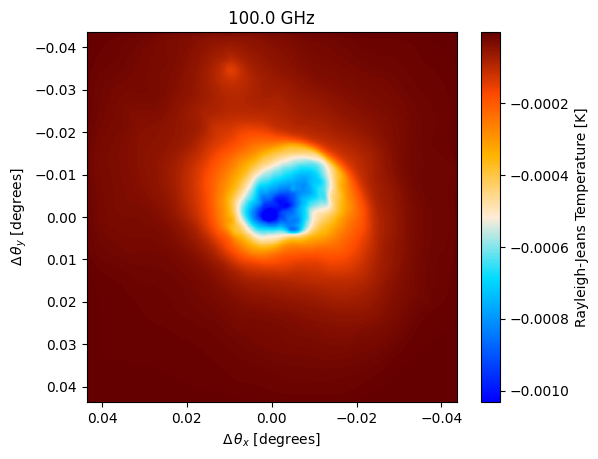

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=-8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

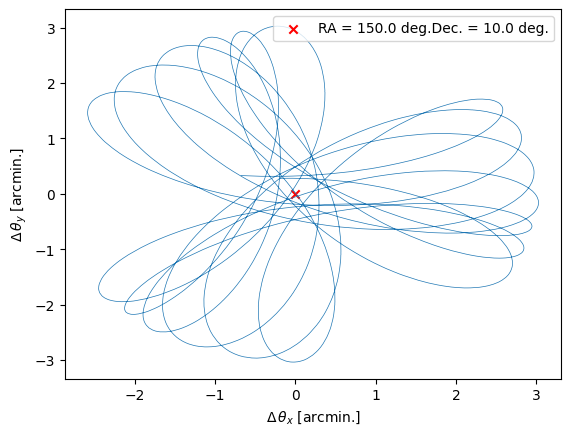

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                    #   duration=600, # integration time in seconds
                      duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-07 14:17:29.058 INFO: Constructed instrument.
2024-10-07 14:17:29.059 INFO: Constructed plan.
2024-10-07 14:17:29.060 INFO: Constructed site.
2024-10-07 14:17:29.651 INFO: Constructed boresight.
2024-10-07 14:17:29.918 INFO: Constructed offsets.


Initialized base in 861 ms.


Generating noise: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]
Generating atmosphere: 4it [00:00,  9.13it/s]
Sampling map (m2/f093): 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


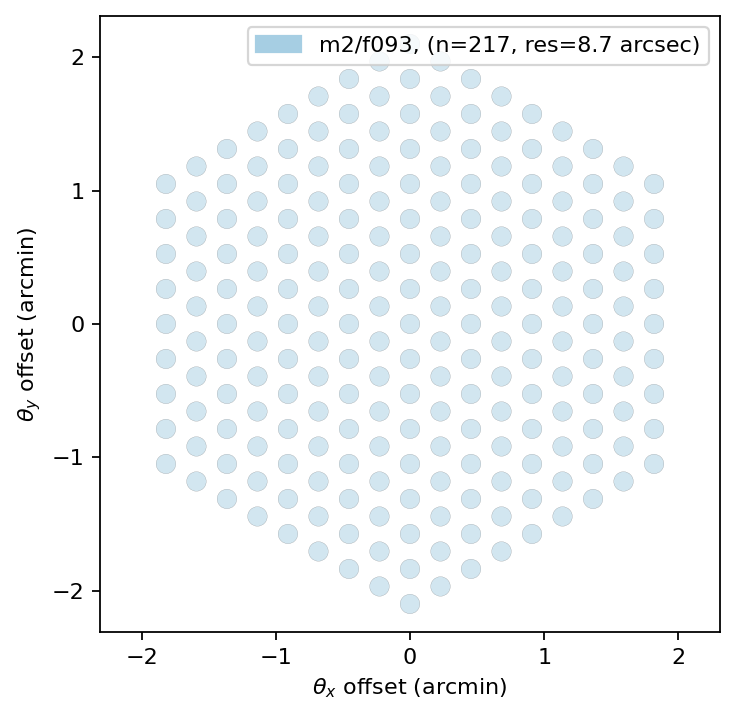

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[-1.96240674e-04, -1.93347998e-04, -1.89985390e-04, ...,
        -4.96567154e-05, -5.31600912e-05, -5.72155970e-05],
       [-2.45368526e-04, -2.42476087e-04, -2.39113735e-04, ...,
        -9.68853867e-05, -1.00388478e-04, -1.04443657e-04],
       [-1.21051829e-04, -1.18159199e-04, -1.14796645e-04, ...,
         2.59204179e-05,  2.24170902e-05,  1.83616428e-05],
       ...,
       [ 1.21593319e-04,  1.24487940e-04,  1.27852648e-04, ...,
         2.52595530e-04,  2.49089835e-04,  2.45031651e-04],
       [-4.04728598e-04, -4.01833655e-04, -3.98468568e-04, ...,
        -2.76444410e-04, -2.79950441e-04, -2.84009034e-04],
       [-7.45629448e-04, -7.42736970e-04, -7.39374550e-04, ...,
        -5.97576858e-04, -6.01079954e-04, -6.05135155e-04]])

Running mapper (m2/f093): 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


mapdata_truth shape: (1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


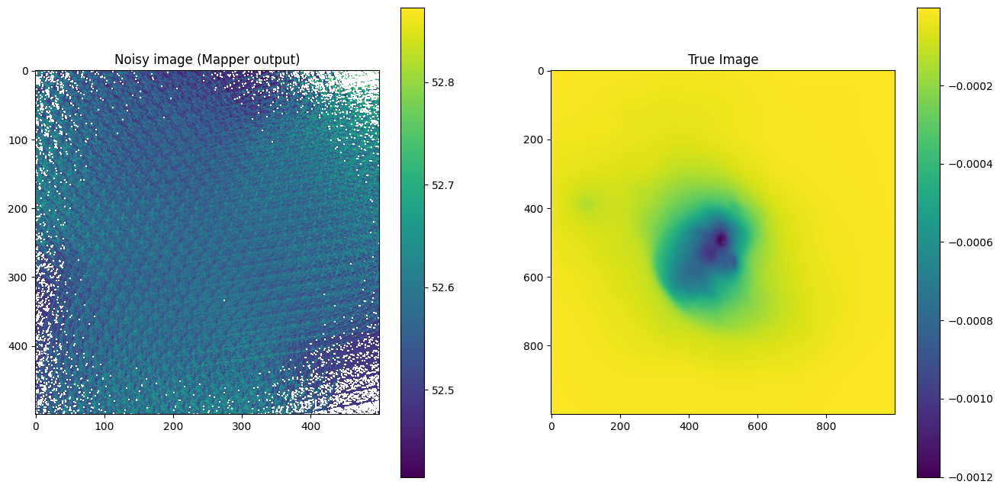

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-07 14:17:41.122 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-07 14:17:41.123 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

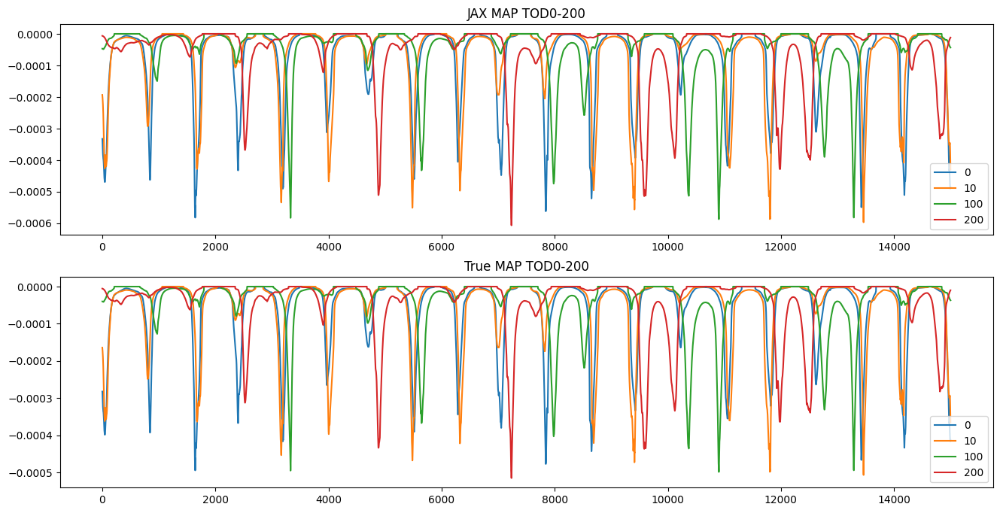

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00024946823


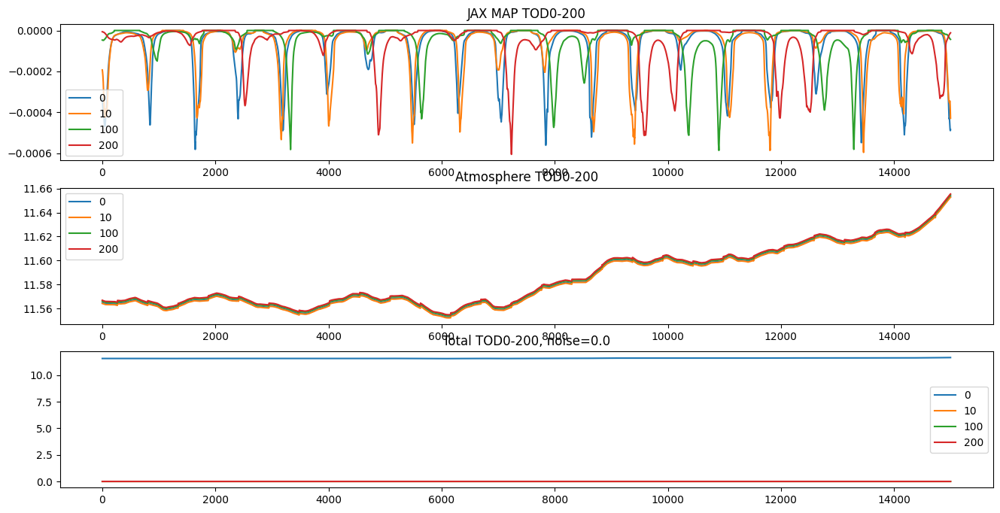

In [8]:
# Pick noise level for rest of run:
noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
# noiselevel = 1.0

# Add n TODs for atmos:
n = 10
# n = noised_jax_tod.shape[0]

jax_tods_atmos = tod_truthmap.components['atmosphere']
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.components['noise']*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos[:n])

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

# Next, initialise nifty prior model

Start with the atmosphere TOD model:

In [9]:
dims_atmos = (jax_tods_atmos.shape[1] + 2000,)
padding_atmos = dims_atmos[0] - jax_tods_atmos.shape[1]

# correlated field zero mode GP offset and stddev
cf_zm_tod = dict(offset_mean=10., offset_std=(2.0, 0.1))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_tod = dict(
    fluctuations=(1, 0.1), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-3, 0.5), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_tod = jft.CorrelatedFieldMaker("")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize()

## Add one Correlated fields per TOD with shared flucts and zero-mean

In [10]:
# init params for each TOD:

gps_tods = []
for i in range(n):
    cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
    # cfmi.set_amplitude_total_offset(**cf_zm_tod)
    cfmi._azm = cfm_tod._azm
    cfmi._offset_mean = cfm_tod._offset_mean
    cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

    cfmi._fluctuations.append(cfm_tod._fluctuations[0])
    cfmi._target_grids.append(cfm_tod._target_grids[0])
    cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
    gps_tods.append(cfmi.finalize())

## Now for the map model:

In [11]:
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
cf_zm_map = dict(offset_mean=-8.7e-5, offset_std=(5e-6, 5e-6))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    fluctuations=(1e-3, 1e-4), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-3e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [12]:
# Define simple signal model with added map sampling
class Signal_TOD(jft.Model):
    def __init__(self, gps_tods, gp_map):
        # self.gp_tod = gp_tod
        # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
        self.gps_tods = gps_tods
        self.tgt = (len(gps_tods), gps_tods[0].target.size)
        self.gp_map = gp_map
        super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
    def __call__(self, x):
        res_tods = jnp.zeros(self.tgt)
        for i, gp in enumerate(self.gps_tods):
            res_tods = res_tods.at[i].set(gp(x))
        
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        # Only add first n atmosphere tods, otherwise use map
        modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

        return modified_res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]
  
signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [13]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod0 xi': ShapeWithDtype(shape=(17000,), dtype=<class 'jax.numpy.float64'>),
	 'tod1 xi': ShapeWithDtype(shape=(17000,), dtype=<class 'jax.numpy.float64'>),
	 'tod2 xi': ShapeWithDtype(shape=(17000,), dtype=<class 'jax.numpy.float64'>),
	 'tod3 xi': ShapeWithDtype(shape=(17000,), dtype=<class 'jax.numpy.float64'>),
	 'tod4 xi': ShapeWithDtype(shape=(17000,), dtype=<class 'jax.numpy.float64'>),
	 'tod5 xi': ShapeWithDtype(shape=(1

# Draw Prior sample

(217, 15000)


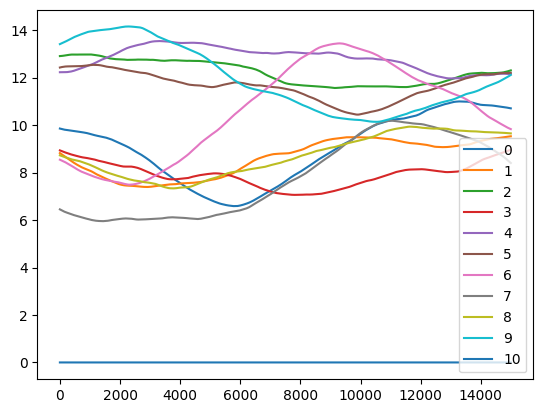

In [14]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
for i in range(11):
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [15]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001


M: →:1.0 ↺:False #∇²:06 |↘|:3.530503e+01 ➽:1.170006e+02
M: Iteration 1 ⛰:+1.618642e+19 Δ⛰:5.095346e+21
OPTIMIZE_KL: Iteration 0001 ⛰:+1.6186e+19
OPTIMIZE_KL: #(KL minimization steps) 1
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 9.9e+12±     0.0, avg: +1.9e+05±     0.0, #dof:3255000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.25±     0.0, avg:     -0.5±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:    0.12±     0.0, avg:    +0.34±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg:  -0.0011±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:   0.095±     0.0, avg:    -0.31±     0.0, #dof:      1'
tod fluctuations        :: 'reduced χ²:     5.7±     0.0, avg:     -2.4±     0.0, #dof:      1'
tod loglogavgslope      :: 'reduced χ²:     7.6±     0.0, avg:     -2.8±     0.0, #dof:      1'
tod0 xi                 :: 'reduced χ²:    0.99±     0.0, avg: +0.00077±     0.0, #dof:  17000'
tod1

In [16]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.49883372, dtype=float64),
	 'cfmapax1loglogavgslope': Array(0.34325523, dtype=float64),
	 'cfmapxi': Array([[ 0.61236252, -2.07697038,  0.03058991, ...,  1.08225839,
	         0.26695839,  0.08981161],
	       [ 1.23259544, -0.70963587,  1.04167476, ..., -1.35552994,
	         1.54026183,  0.75643569],
	       [-0.23181022, -2.39938761, -1.46922407, ...,  0.17902692,
	         0.1199335 , -0.02309461],
	       ...,
	       [ 1.37502167,  1.41589815,  1.75137268, ..., -0.47546732,
	        -0.10847758,  0.86435424],
	       [-0.38454734,  1.30220401, -1.70473312, ...,  0.27295684,
	         1.53709592, -0.21207276],
	       [-2.05279725, -0.02123784, -1.24375729, ..., -2.0129931 ,
	         1.3330417 ,  1.78585453]], dtype=float64),
	 'cfmapzeromode': Array(-0.30883771, dtype=float64),
	 'tod fluctuations': Array(-2.38368662, dtype=float64),
	 'tod loglogavgslope': Array(-2.76012162, dtype=float64),
	 'tod0 xi': Array([ 0.77255513,  0.11238933,

In [17]:
def printfitresults():
    print("Fit Results (res, init, std)")
    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(samples.pos['zeromode'])}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")

    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode: {jft.NormalPrior(cf_zm_map['offset_mean'], cf_zm_map['offset_std'][0])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_mean']}, {cf_zm_map['offset_std'][0]}")
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.7844667333710038, 1, 0.1
	loglogvarslope: -4.38006080986732, -3, 0.5
	zeromode: 8.763097031515395, 10.0, 2.0
map:
	fluctuations: 0.0009467364735428316, 0.001, 0.0001
	loglogvarslope: -2.8283723854993843, -3.0, 0.5
	zeromode: -8.854418855089003e-05, -8.7e-05, 5e-06


(217, 15000)


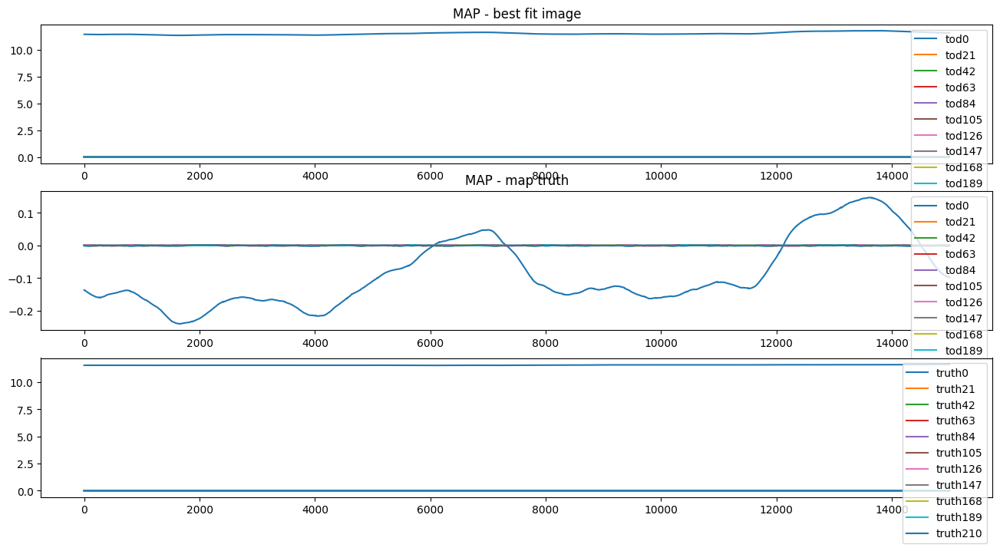

In [18]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in range(0, res.shape[0], res.shape[0]//10):
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].legend()

plt.show()

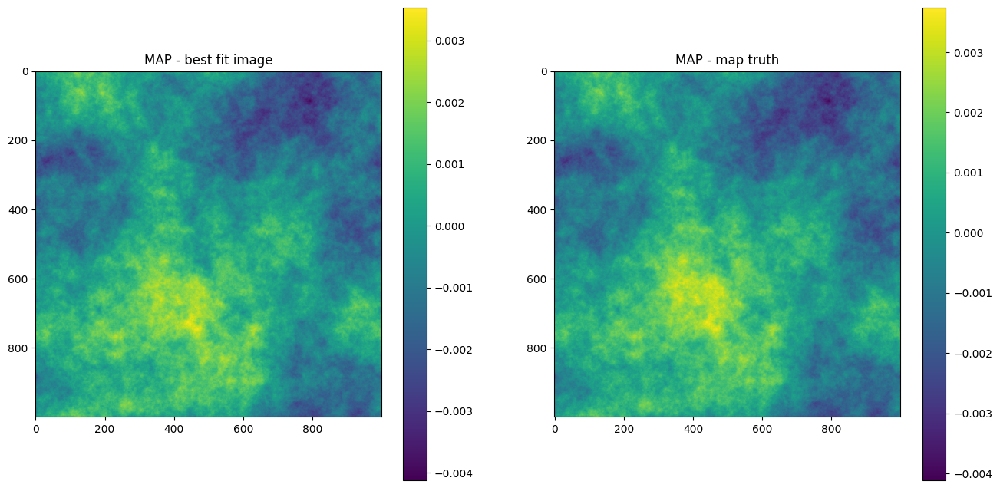

In [19]:
# plot maximum of posterior (mode)
# sig_map = signal_response(samples.pos) # gives time-series
sig_map = gp_map(samples.pos) # when splitting up in different field models

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [20]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+3.5782e+21 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+8.1084e+20 Δ⛰:2.7674e+21 ➽:1.1700e-05
SL: Iteration 2 ⛰:+2.0746e+20 Δ⛰:6.0339e+20 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.9481e+20 Δ⛰:1.2645e+19 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.4590e+20 Δ⛰:4.8907e+19 ➽:1.1700e-05
SL: Iteration 5 ⛰:+8.0656e+19 Δ⛰:6.5248e+19 ➽:1.1700e-05
SL: Iteration 6 ⛰:+7.2283e+19 Δ⛰:8.3729e+18 ➽:1.1700e-05
SL: Iteration 7 ⛰:+6.6187e+19 Δ⛰:6.0959e+18 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.7916e+19 Δ⛰:2.8271e+19 ➽:1.1700e-05
SL: Iteration 9 ⛰:+3.3530e+19 Δ⛰:4.3861e+18 ➽:1.1700e-05
SL: Iteration 10 ⛰:+2.9723e+19 Δ⛰:3.8067e+18 ➽:1.1700e-05
SL: Iteration 11 ⛰:+2.7223e+19 Δ⛰:2.5003e+18 ➽:1.1700e-05
SL: Iteration 12 ⛰:+2.1384e+19 Δ⛰:5.8395e+18 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.7740e+19 Δ⛰:3.6436e+18 ➽:1.1700e-05
SL: Iteration 14 ⛰:+1.4735e+19 Δ⛰:3.0053e+18 ➽:1.1700e-05
SL: Iteration 15 ⛰:+1.4559e+19 Δ⛰:1.7617e+17 ➽:1.1700e-05
SL: Iteration 16 ⛰:+1.2603e+19 Δ⛰:1.9551e+18 ➽:1.1700e-05
SL: 

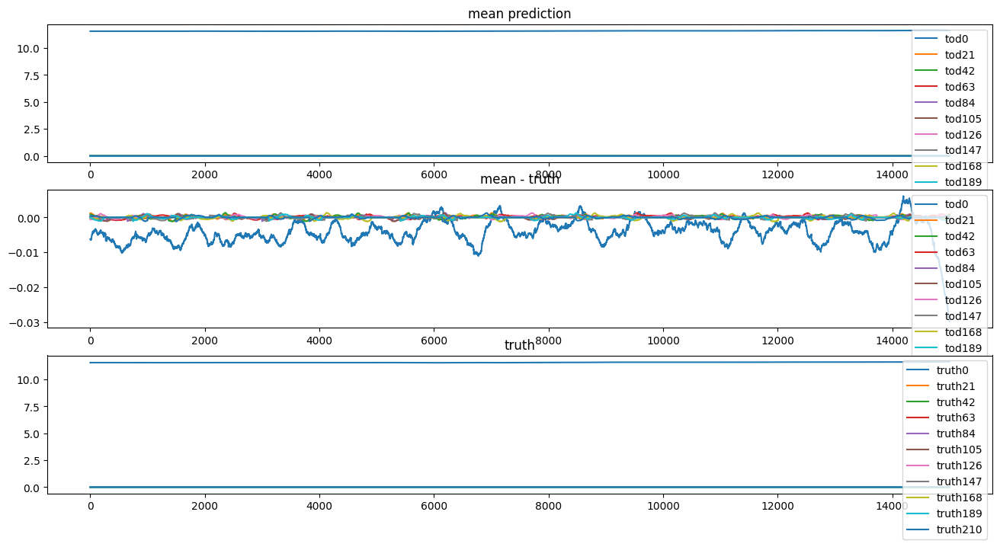

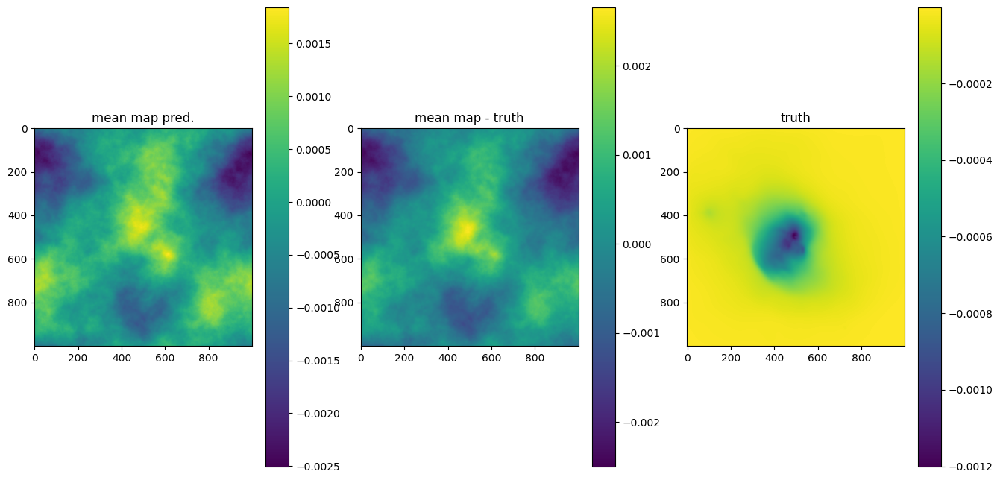

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+3.5733e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.0308e+17 Δ⛰:3.4702e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+9.0440e+16 Δ⛰:1.2643e+16 ➽:1.1700e-05
SL: Iteration 3 ⛰:+5.3864e+16 Δ⛰:3.6576e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.6365e+16 Δ⛰:3.7499e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.6298e+16 Δ⛰:6.6909e+13 ➽:1.1700e-05
SL: Iteration 6 ⛰:+1.1396e+16 Δ⛰:4.9026e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+7.0400e+15 Δ⛰:4.3558e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+7.0346e+15 Δ⛰:5.4641e+12 ➽:1.1700e-05
SL: Iteration 9 ⛰:+5.9285e+15 Δ⛰:1.1061e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+5.6864e+15 Δ⛰:2.4211e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+3.4669e+15 Δ⛰:2.2195e+15 ➽:1.1700e-05
SL: Iteration 12 ⛰:+2.7910e+15 Δ⛰:6.7583e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+2.6499e+15 Δ⛰:1.4111e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+2.6498e+15 Δ⛰:1.5007e+11 ➽:1.1700e-05
SL: Iteration 15 ⛰:+2.4517e+15 Δ⛰:1.9805e+14 ➽:1.1700e-05
SL: Iteration 16 ⛰:+1.9272e+15 Δ⛰:5.2453e+14 ➽:1.1700e-05
SL: 

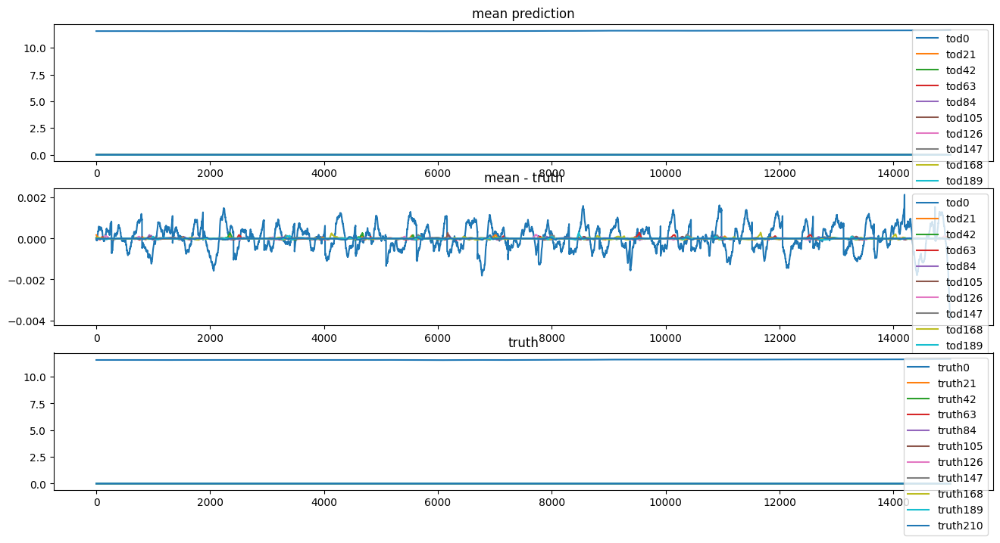

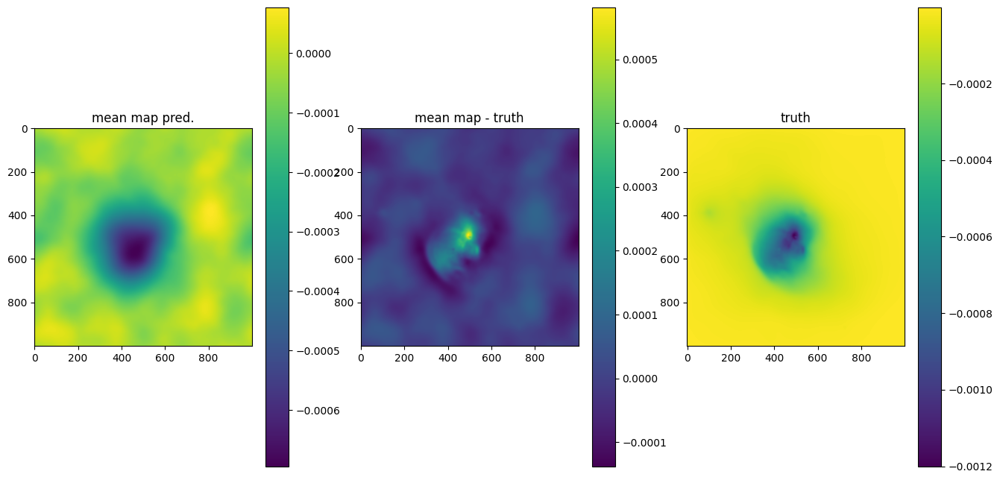

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.2808e+19 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+3.8932e+18 Δ⛰:8.9152e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+9.4545e+16 Δ⛰:3.7986e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.6613e+16 Δ⛰:7.7932e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.2188e+16 Δ⛰:4.4255e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.2103e+16 Δ⛰:8.4893e+13 ➽:1.1700e-05
SL: Iteration 6 ⛰:+9.5480e+15 Δ⛰:2.5546e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+9.5208e+15 Δ⛰:2.7239e+13 ➽:1.1700e-05
SL: Iteration 8 ⛰:+5.4727e+15 Δ⛰:4.0481e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+4.6345e+15 Δ⛰:8.3815e+14 ➽:1.1700e-05
SL: Iteration 10 ⛰:+4.5845e+15 Δ⛰:4.9996e+13 ➽:1.1700e-05
SL: Iteration 11 ⛰:+2.7435e+15 Δ⛰:1.8410e+15 ➽:1.1700e-05
SL: Iteration 12 ⛰:+2.4124e+15 Δ⛰:3.3104e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+2.4122e+15 Δ⛰:2.2659e+11 ➽:1.1700e-05
SL: Iteration 14 ⛰:+2.1371e+15 Δ⛰:2.7512e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+1.8132e+15 Δ⛰:3.2389e+14 ➽:1.1700e-05
SL: Iteration 16 ⛰:+1.1788e+15 Δ⛰:6.3437e+14 ➽:1.1700e-05
SL: 

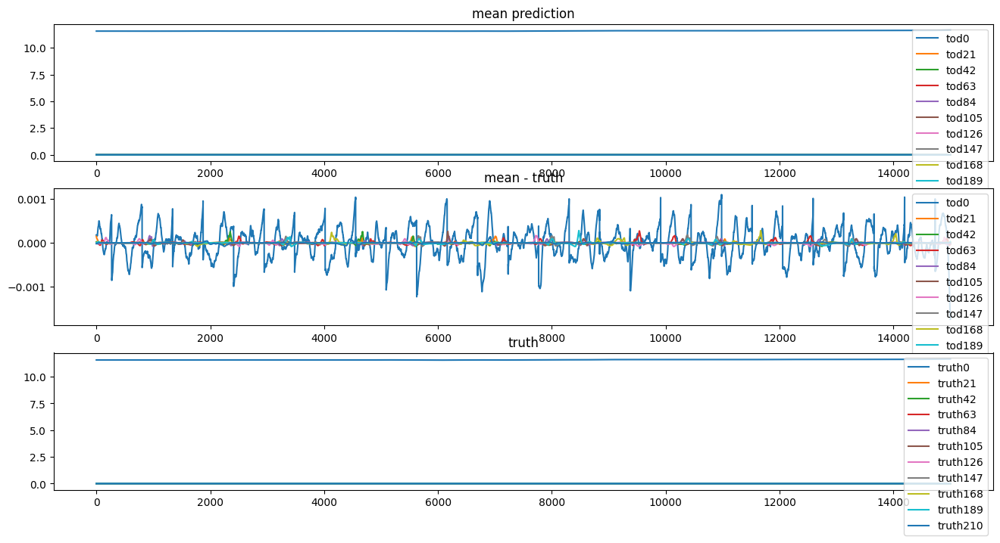

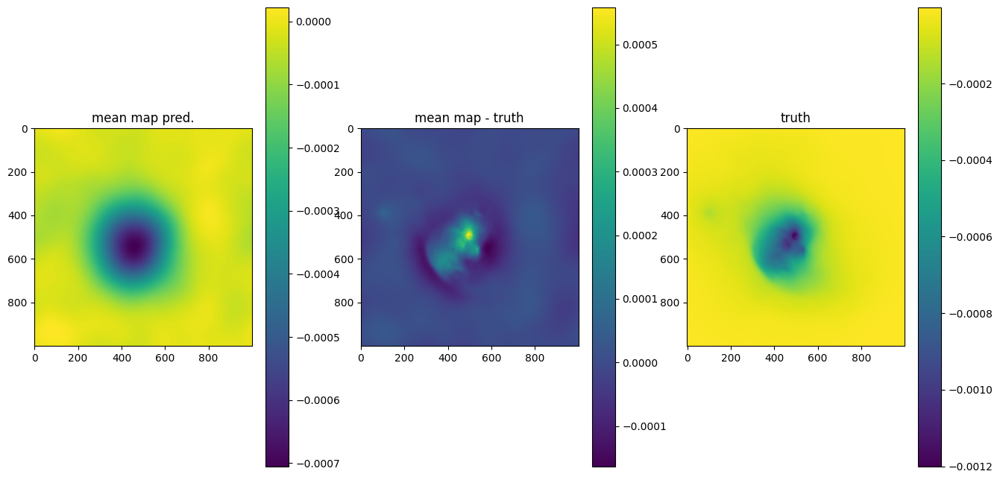

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+2.6437e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.5779e+18 Δ⛰:1.0658e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+9.4973e+16 Δ⛰:1.4830e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+2.0298e+16 Δ⛰:7.4675e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.3643e+16 Δ⛰:6.6551e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.3319e+16 Δ⛰:3.2398e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+9.6815e+15 Δ⛰:3.6373e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+6.9564e+15 Δ⛰:2.7251e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+4.4005e+15 Δ⛰:2.5560e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+3.9155e+15 Δ⛰:4.8493e+14 ➽:1.1700e-05
SL: Iteration 10 ⛰:+3.9098e+15 Δ⛰:5.6833e+12 ➽:1.1700e-05
SL: Iteration 11 ⛰:+2.3273e+15 Δ⛰:1.5826e+15 ➽:1.1700e-05
SL: Iteration 12 ⛰:+2.0302e+15 Δ⛰:2.9705e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.8511e+15 Δ⛰:1.7912e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+1.4396e+15 Δ⛰:4.1148e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+1.4309e+15 Δ⛰:8.7872e+12 ➽:1.1700e-05
SL: Iteration 16 ⛰:+9.3464e+14 Δ⛰:4.9622e+14 ➽:1.1700e-05
SL: 

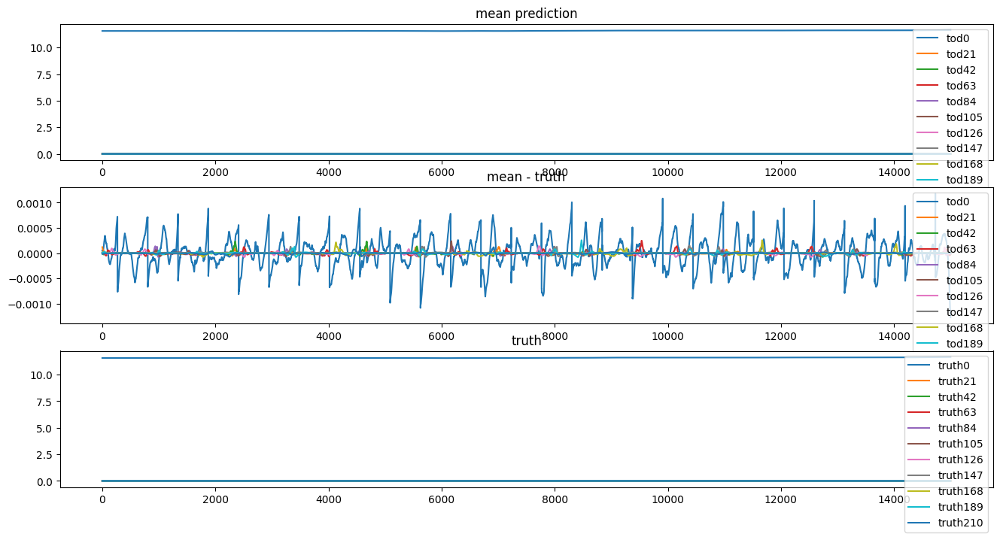

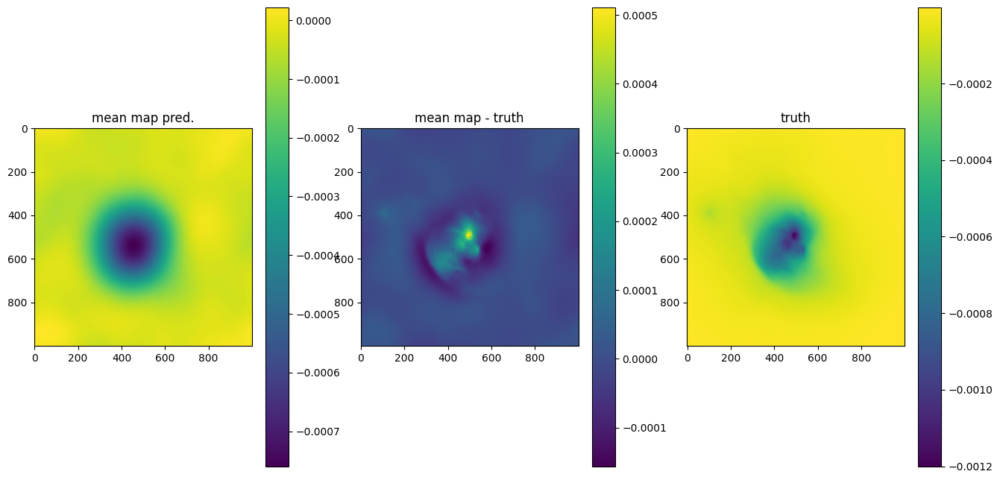

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+2.8751e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.8318e+18 Δ⛰:1.0432e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.5700e+17 Δ⛰:1.6748e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+3.0614e+16 Δ⛰:1.2638e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.3622e+16 Δ⛰:1.6993e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.3459e+16 Δ⛰:1.6211e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+1.0604e+16 Δ⛰:2.8554e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+4.6436e+15 Δ⛰:5.9605e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+4.6332e+15 Δ⛰:1.0401e+13 ➽:1.1700e-05
SL: Iteration 9 ⛰:+4.3089e+15 Δ⛰:3.2427e+14 ➽:1.1700e-05
SL: Iteration 10 ⛰:+4.3009e+15 Δ⛰:7.9786e+12 ➽:1.1700e-05
SL: Iteration 11 ⛰:+2.2710e+15 Δ⛰:2.0299e+15 ➽:1.1700e-05
SL: Iteration 12 ⛰:+2.0676e+15 Δ⛰:2.0337e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.4642e+15 Δ⛰:6.0347e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+1.4551e+15 Δ⛰:9.0672e+12 ➽:1.1700e-05
SL: Iteration 15 ⛰:+1.4528e+15 Δ⛰:2.3537e+12 ➽:1.1700e-05
SL: Iteration 16 ⛰:+9.6276e+14 Δ⛰:4.8999e+14 ➽:1.1700e-05
SL: 

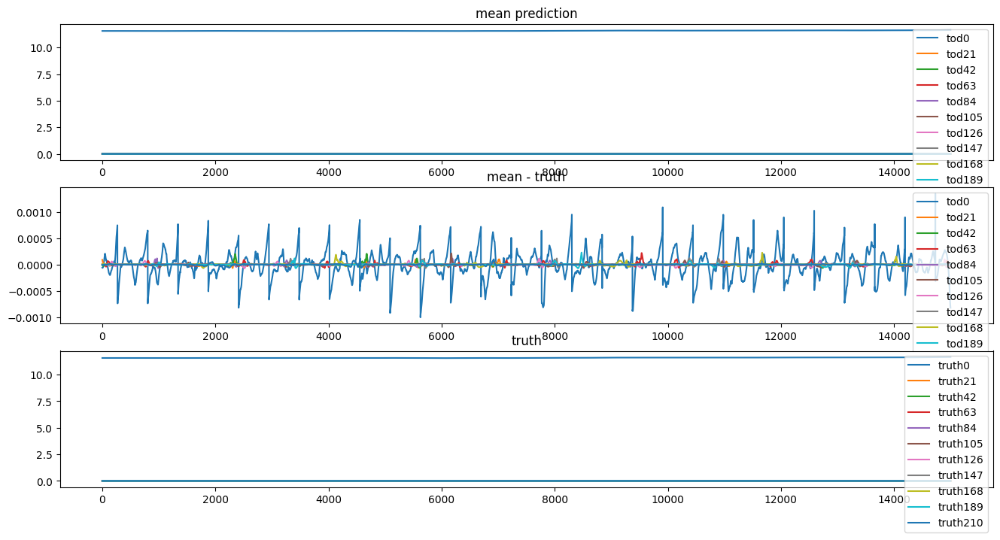

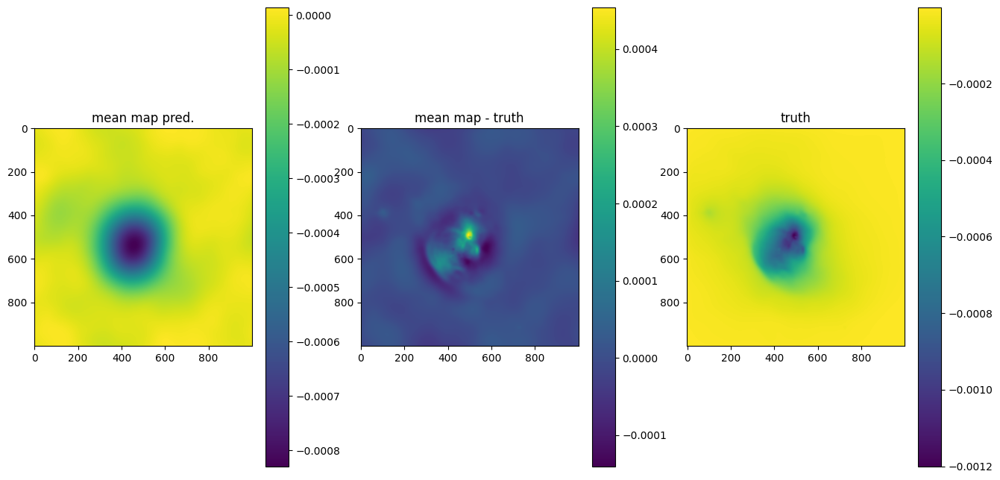

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+4.6910e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+2.5515e+18 Δ⛰:2.1395e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.1531e+17 Δ⛰:2.4362e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+2.4924e+16 Δ⛰:9.0386e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.2228e+16 Δ⛰:1.2696e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.2117e+16 Δ⛰:1.1122e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+9.2547e+15 Δ⛰:2.8623e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+3.8175e+15 Δ⛰:5.4372e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.6116e+15 Δ⛰:2.0596e+14 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.6035e+15 Δ⛰:1.0081e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+2.6000e+15 Δ⛰:3.4993e+12 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.6263e+15 Δ⛰:9.7371e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.3238e+15 Δ⛰:3.0245e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.0649e+15 Δ⛰:2.5892e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+9.2600e+14 Δ⛰:1.3890e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+9.2453e+14 Δ⛰:1.4736e+12 ➽:1.1700e-05
SL: Iteration 16 ⛰:+7.9637e+14 Δ⛰:1.2815e+14 ➽:1.1700e-05
SL: 

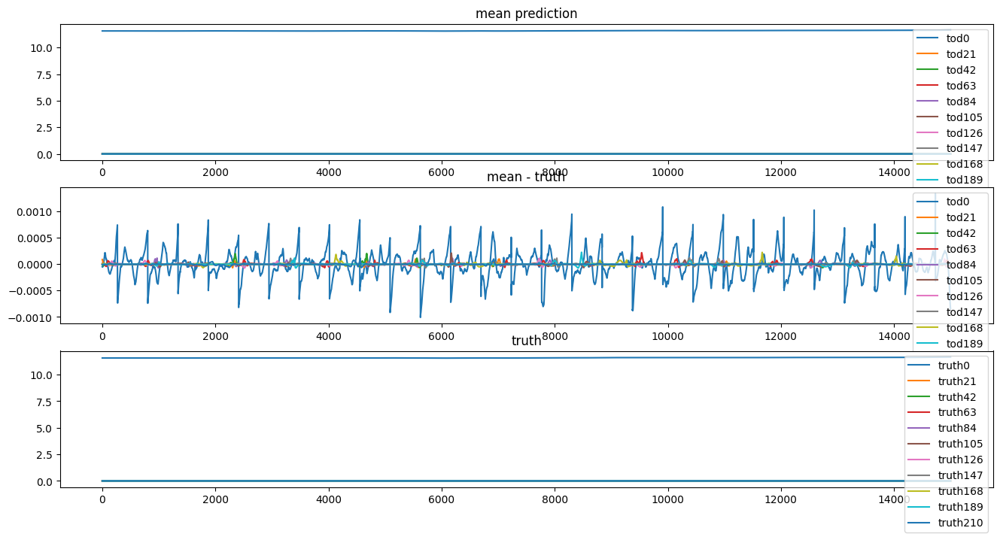

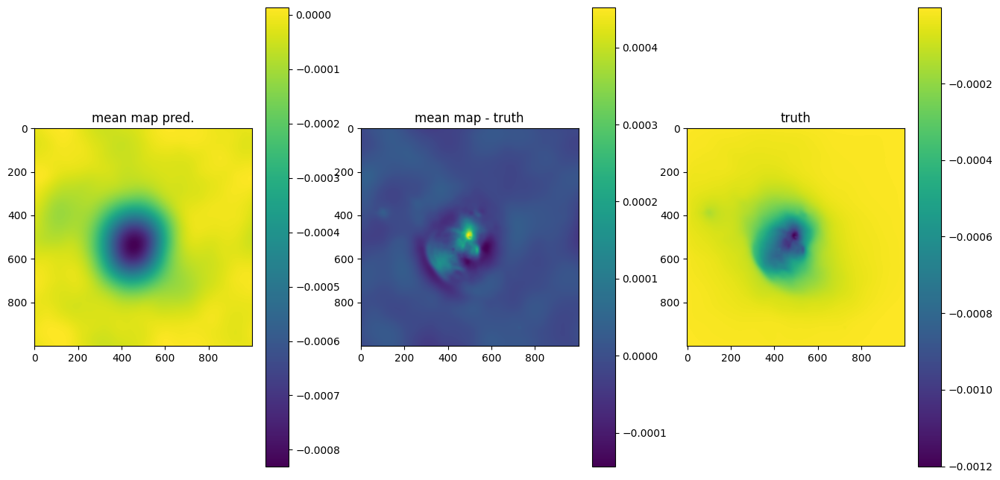

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+4.1575e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.6485e+18 Δ⛰:2.5090e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.2774e+17 Δ⛰:1.5208e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.4990e+16 Δ⛰:1.1275e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+8.9289e+15 Δ⛰:6.0606e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+8.4559e+15 Δ⛰:4.7305e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+7.0742e+15 Δ⛰:1.3817e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+3.6165e+15 Δ⛰:3.4577e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.5834e+15 Δ⛰:3.3127e+13 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.6405e+15 Δ⛰:9.4291e+14 ➽:1.1700e-05
SL: Iteration 10 ⛰:+2.6370e+15 Δ⛰:3.4494e+12 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.9037e+15 Δ⛰:7.3333e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.6217e+15 Δ⛰:2.8199e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.1634e+15 Δ⛰:4.5834e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+1.1565e+15 Δ⛰:6.8489e+12 ➽:1.1700e-05
SL: Iteration 15 ⛰:+1.1561e+15 Δ⛰:4.4592e+11 ➽:1.1700e-05
SL: Iteration 16 ⛰:+7.5446e+14 Δ⛰:4.0160e+14 ➽:1.1700e-05
SL: 

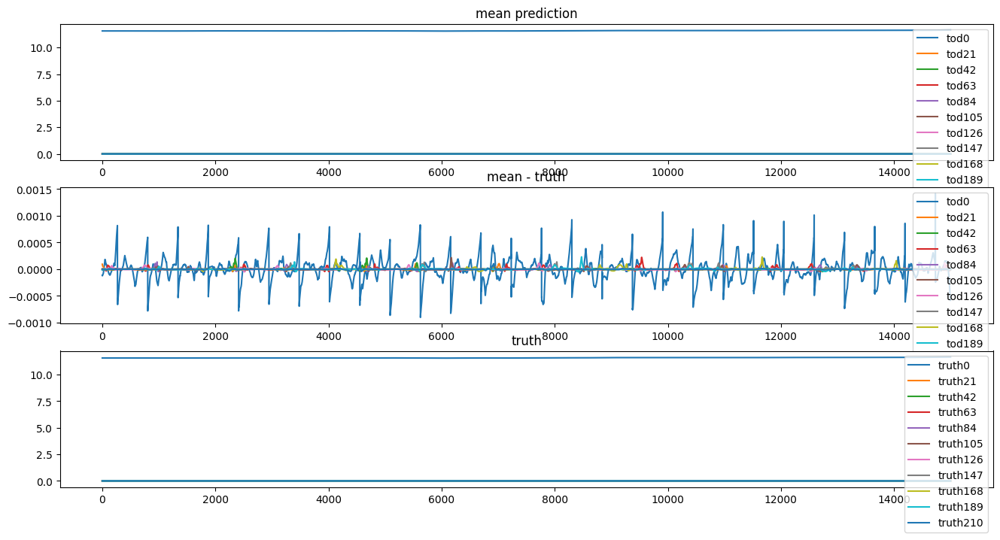

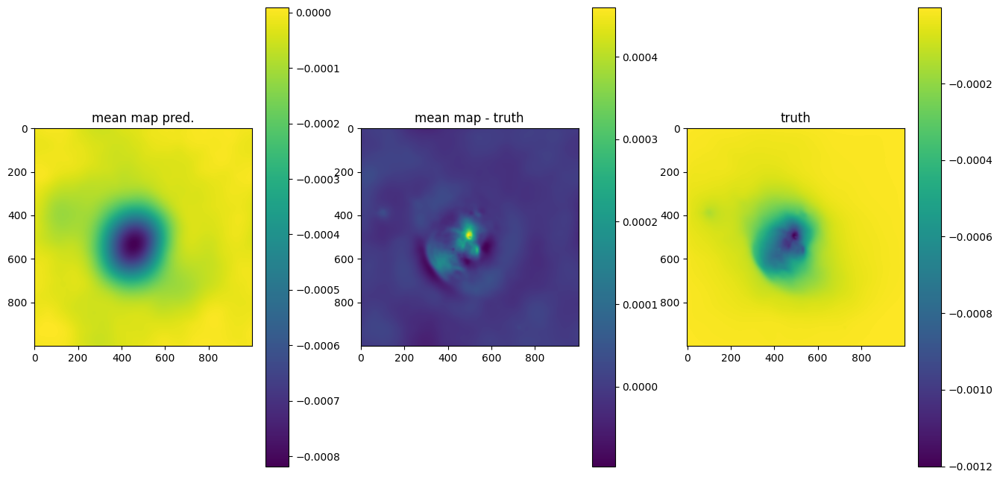

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+4.8088e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+7.8035e+17 Δ⛰:4.0285e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.5086e+17 Δ⛰:6.2949e+17 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.6119e+16 Δ⛰:1.3474e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.0490e+16 Δ⛰:5.6287e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.0367e+16 Δ⛰:1.2299e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+8.7094e+15 Δ⛰:1.6577e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+4.8270e+15 Δ⛰:3.8825e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+4.8204e+15 Δ⛰:6.5755e+12 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.3594e+15 Δ⛰:2.4610e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+2.3005e+15 Δ⛰:5.8927e+13 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.3790e+15 Δ⛰:9.2149e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.1379e+15 Δ⛰:2.4107e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+7.7468e+14 Δ⛰:3.6325e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+7.7433e+14 Δ⛰:3.4486e+11 ➽:1.1700e-05
SL: Iteration 15 ⛰:+7.7160e+14 Δ⛰:2.7379e+12 ➽:1.1700e-05
SL: Iteration 16 ⛰:+6.5536e+14 Δ⛰:1.1623e+14 ➽:1.1700e-05
SL: 

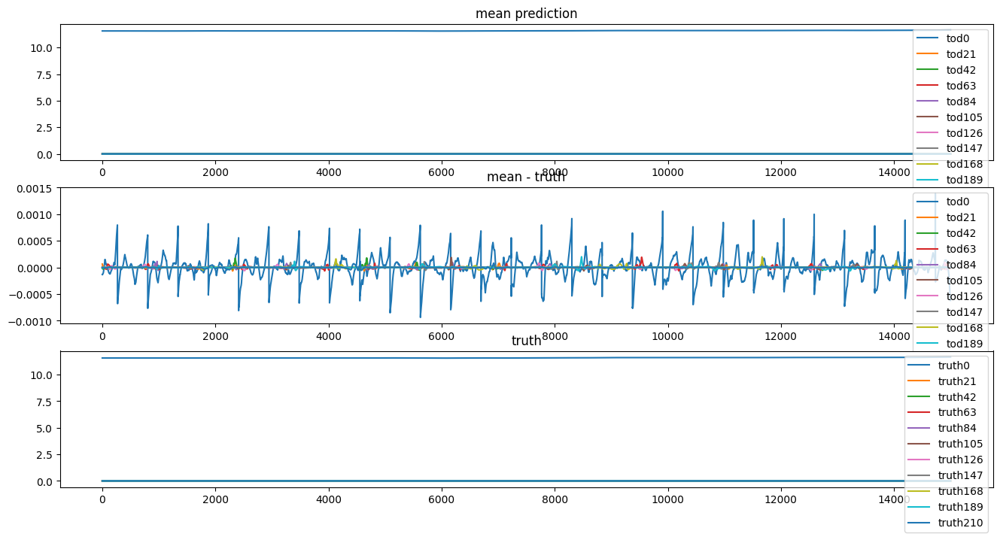

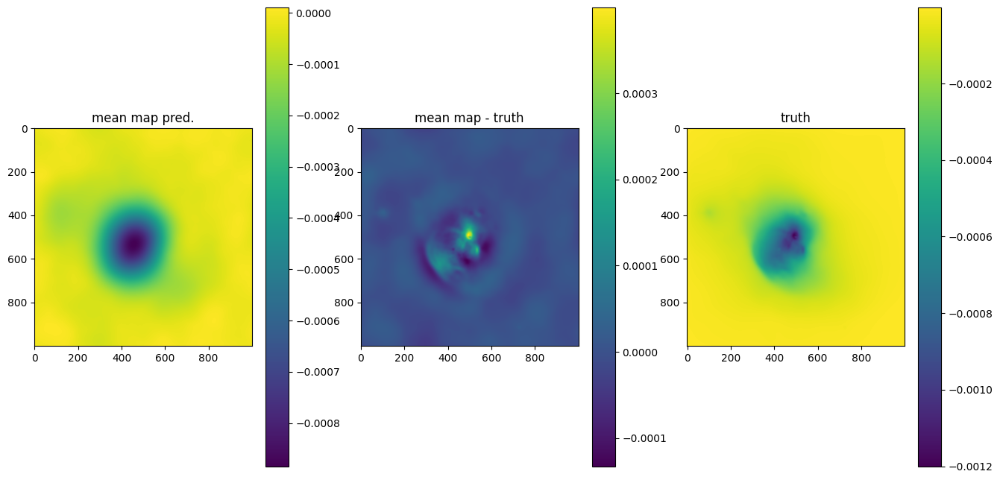

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+4.5487e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+3.4504e+18 Δ⛰:1.0983e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.4073e+17 Δ⛰:3.3097e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.8939e+16 Δ⛰:1.2179e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.1330e+16 Δ⛰:7.6086e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.1151e+16 Δ⛰:1.7950e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+9.1057e+15 Δ⛰:2.0451e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+4.5154e+15 Δ⛰:4.5903e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+4.2399e+15 Δ⛰:2.7549e+14 ➽:1.1700e-05
SL: Iteration 9 ⛰:+1.9726e+15 Δ⛰:2.2673e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.7165e+15 Δ⛰:2.5611e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.4630e+15 Δ⛰:2.5354e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.2157e+15 Δ⛰:2.4729e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.0792e+15 Δ⛰:1.3648e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+6.9135e+14 Δ⛰:3.8783e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+6.8784e+14 Δ⛰:3.5138e+12 ➽:1.1700e-05
SL: Iteration 16 ⛰:+6.1701e+14 Δ⛰:7.0829e+13 ➽:1.1700e-05
SL: 

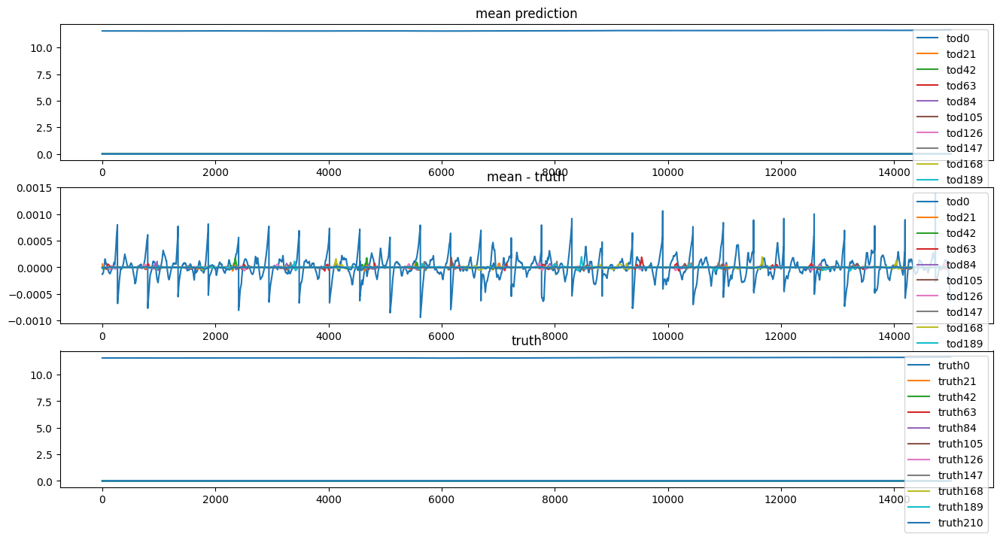

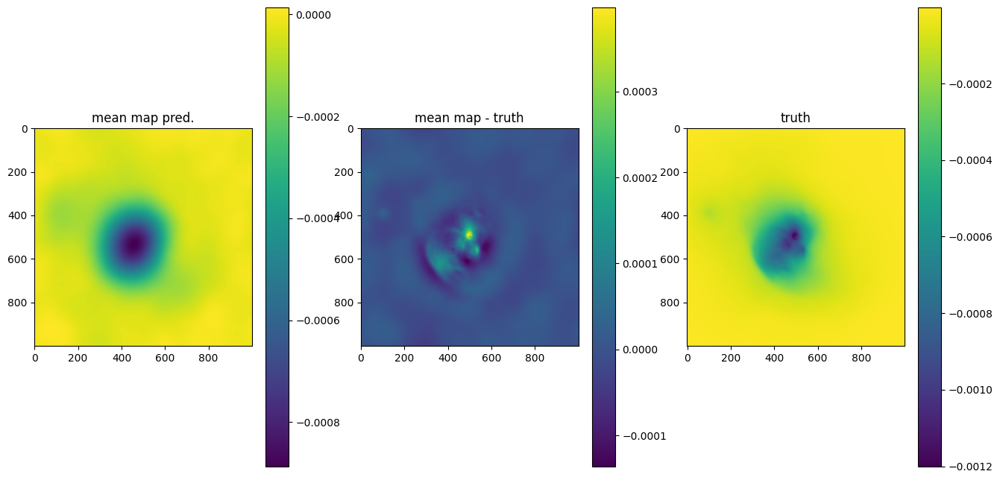

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+3.5942e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+2.5244e+18 Δ⛰:1.0698e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.0143e+17 Δ⛰:2.4229e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+9.6288e+15 Δ⛰:9.1804e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+7.4051e+15 Δ⛰:2.2237e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+6.9334e+15 Δ⛰:4.7178e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+6.0957e+15 Δ⛰:8.3764e+14 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.1956e+15 Δ⛰:9.0009e+14 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.6691e+15 Δ⛰:1.5266e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.3268e+15 Δ⛰:1.3423e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+2.2299e+15 Δ⛰:9.6941e+13 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.2262e+15 Δ⛰:1.0037e+15 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.1051e+15 Δ⛰:1.2109e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.1001e+15 Δ⛰:5.0498e+12 ➽:1.1700e-05
SL: Iteration 14 ⛰:+7.8932e+14 Δ⛰:3.1073e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+7.5356e+14 Δ⛰:3.5765e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+5.2334e+14 Δ⛰:2.3022e+14 ➽:1.1700e-05
SL: 

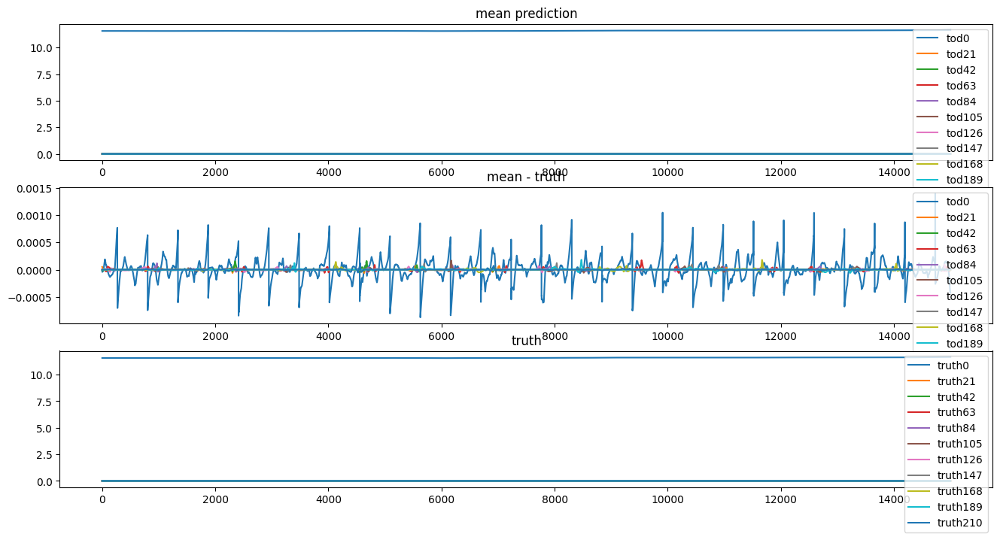

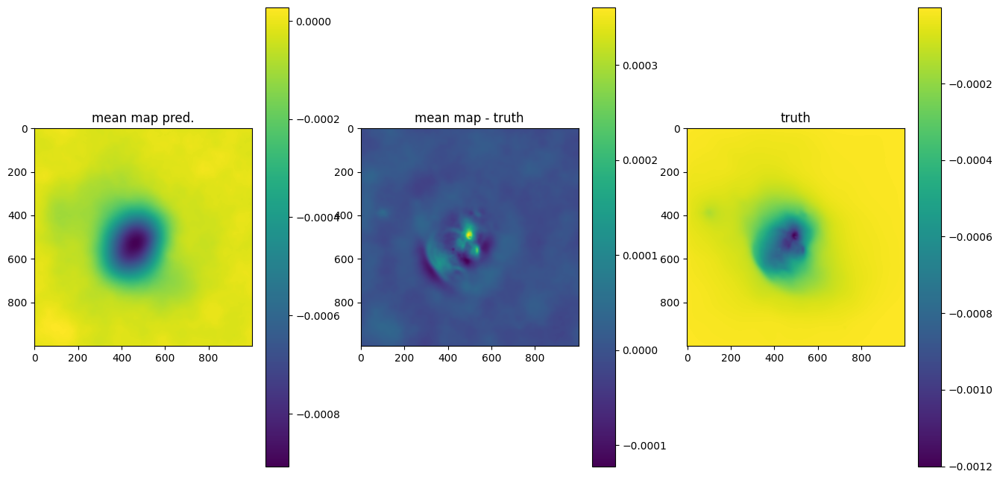

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+7.2801e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+4.6961e+18 Δ⛰:2.5839e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.1213e+17 Δ⛰:4.5840e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+2.4172e+16 Δ⛰:8.7955e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+9.2446e+15 Δ⛰:1.4927e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+9.1793e+15 Δ⛰:6.5325e+13 ➽:1.1700e-05
SL: Iteration 6 ⛰:+7.4162e+15 Δ⛰:1.7631e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.8533e+15 Δ⛰:1.5629e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.6432e+15 Δ⛰:2.2101e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.2572e+15 Δ⛰:1.3860e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.7531e+15 Δ⛰:5.0411e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.5349e+15 Δ⛰:2.1815e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.0894e+15 Δ⛰:4.4556e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.0721e+15 Δ⛰:1.7203e+13 ➽:1.1700e-05
SL: Iteration 14 ⛰:+6.1551e+14 Δ⛰:4.5664e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+5.6636e+14 Δ⛰:4.9148e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+5.3084e+14 Δ⛰:3.5527e+13 ➽:1.1700e-05
SL: 

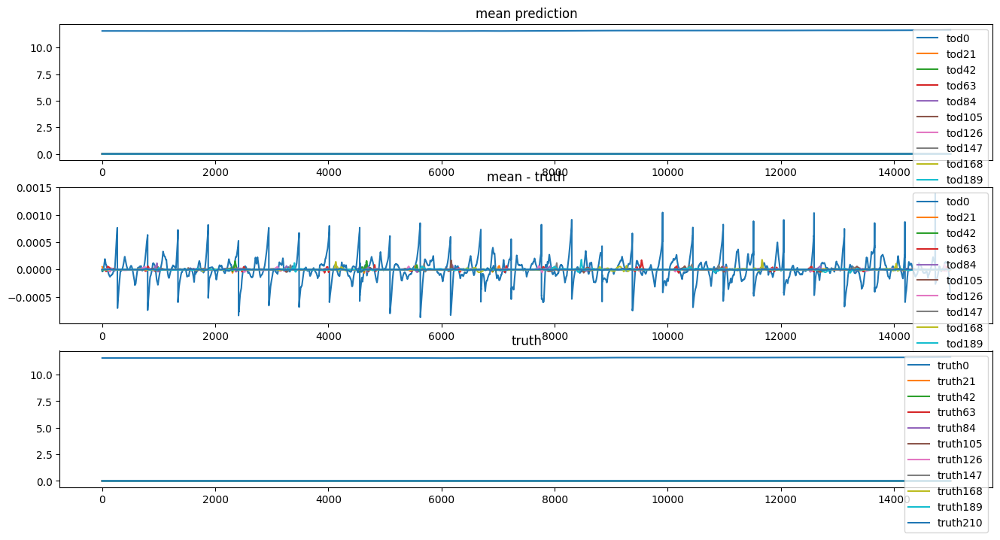

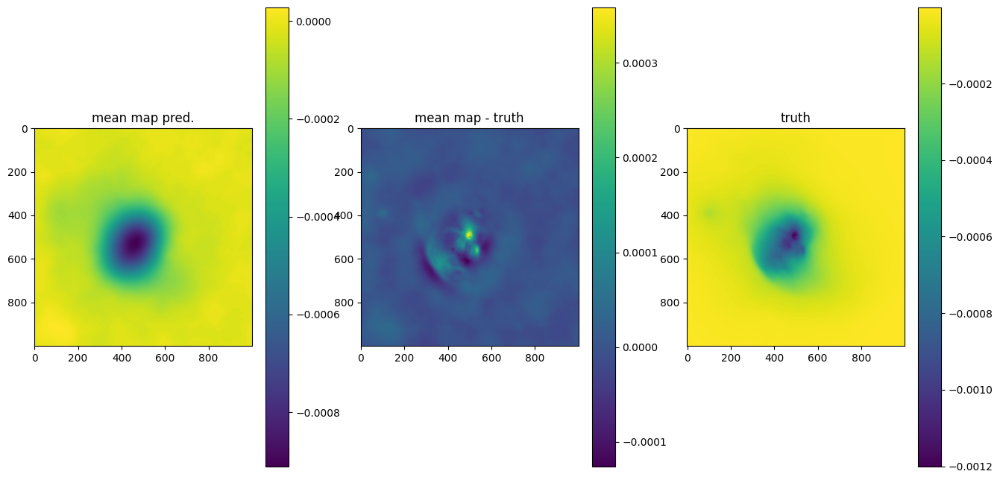

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+3.3574e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.3947e+18 Δ⛰:1.9627e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+9.3985e+16 Δ⛰:1.3007e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.6101e+16 Δ⛰:7.7884e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+8.7008e+15 Δ⛰:7.4002e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+8.5833e+15 Δ⛰:1.1751e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+7.1493e+15 Δ⛰:1.4340e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+4.8911e+15 Δ⛰:2.2582e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.9120e+15 Δ⛰:9.7919e+14 ➽:1.1700e-05
SL: Iteration 9 ⛰:+1.8457e+15 Δ⛰:2.0663e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.4989e+15 Δ⛰:3.4679e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.1733e+15 Δ⛰:3.2554e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+9.8111e+14 Δ⛰:1.9222e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+6.5170e+14 Δ⛰:3.2941e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.2405e+14 Δ⛰:1.2765e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+4.7830e+14 Δ⛰:4.5746e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.5965e+14 Δ⛰:1.8652e+13 ➽:1.1700e-05
SL: 

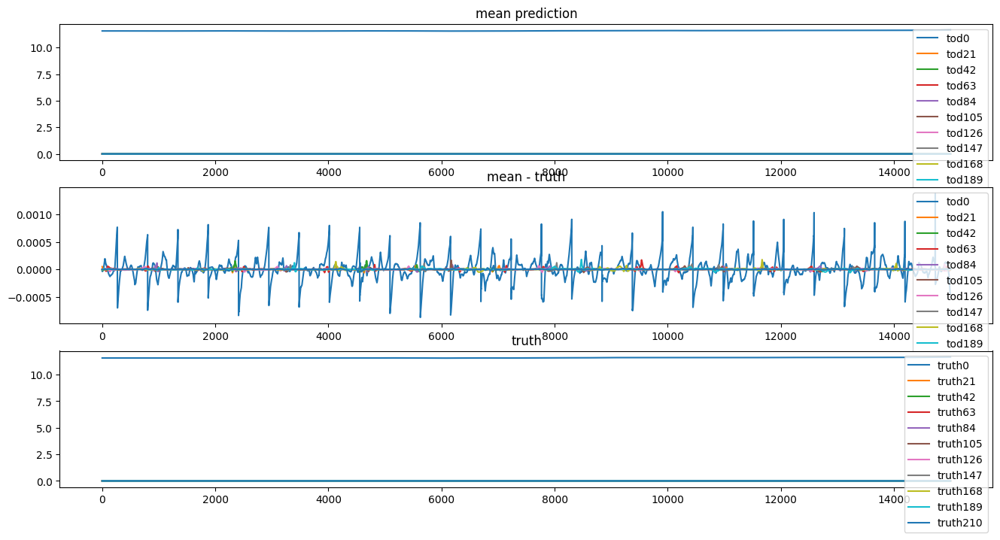

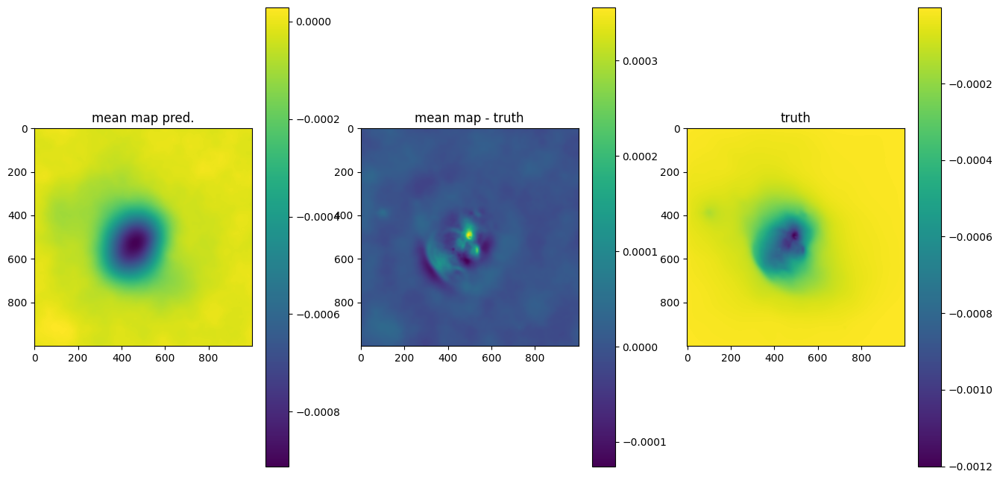

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+1.7209e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.0544e+18 Δ⛰:6.6648e+17 ➽:1.1700e-05
SL: Iteration 2 ⛰:+8.3010e+16 Δ⛰:9.7140e+17 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.5109e+16 Δ⛰:6.7902e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.0830e+16 Δ⛰:4.2784e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+9.6952e+15 Δ⛰:1.1349e+15 ➽:1.1700e-05
SL: Iteration 6 ⛰:+8.6883e+15 Δ⛰:1.0069e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.4469e+15 Δ⛰:3.2414e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.6646e+15 Δ⛰:1.7823e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.1266e+15 Δ⛰:1.5380e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.5026e+15 Δ⛰:6.2397e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.2398e+15 Δ⛰:2.6286e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.0846e+15 Δ⛰:1.5515e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.0713e+15 Δ⛰:1.3301e+13 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.9810e+14 Δ⛰:4.7321e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+5.5083e+14 Δ⛰:4.7266e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+5.3554e+14 Δ⛰:1.5295e+13 ➽:1.1700e-05
SL: 

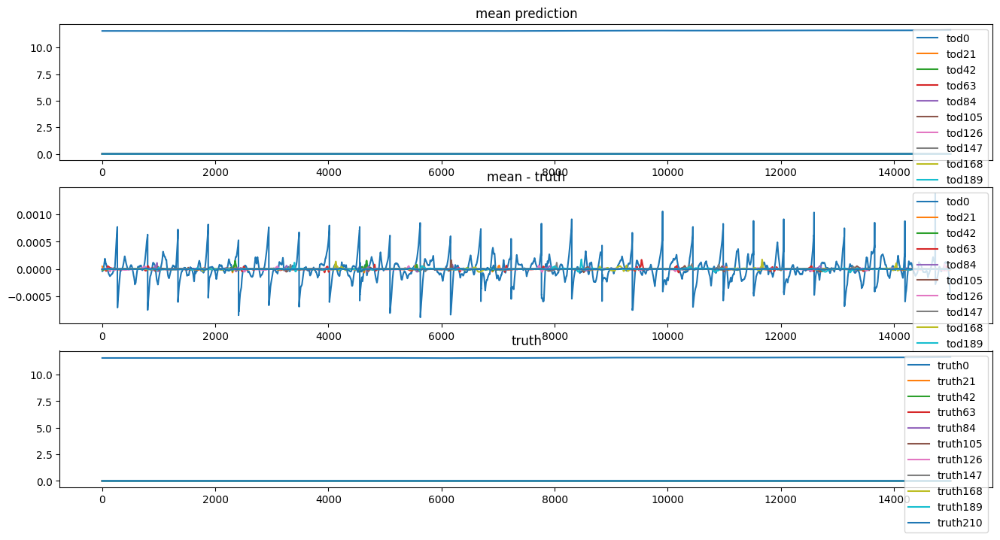

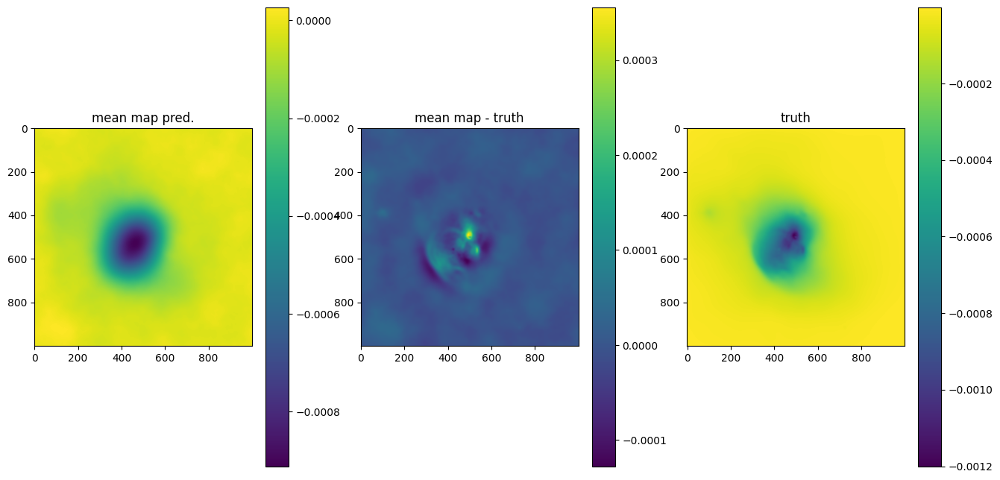

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+3.2881e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+2.1648e+18 Δ⛰:1.1233e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.1105e+17 Δ⛰:2.0538e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.1381e+16 Δ⛰:9.9673e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+8.5061e+15 Δ⛰:2.8751e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+8.4657e+15 Δ⛰:4.0338e+13 ➽:1.1700e-05
SL: Iteration 6 ⛰:+6.8529e+15 Δ⛰:1.6128e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+3.3787e+15 Δ⛰:3.4742e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+2.6725e+15 Δ⛰:7.0623e+14 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.3787e+15 Δ⛰:2.9376e+14 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.5638e+15 Δ⛰:8.1489e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.1279e+15 Δ⛰:4.3593e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.0009e+15 Δ⛰:1.2696e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+8.6445e+14 Δ⛰:1.3647e+14 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.5628e+14 Δ⛰:3.0817e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+5.3759e+14 Δ⛰:1.8689e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.8508e+14 Δ⛰:5.2507e+13 ➽:1.1700e-05
SL: 

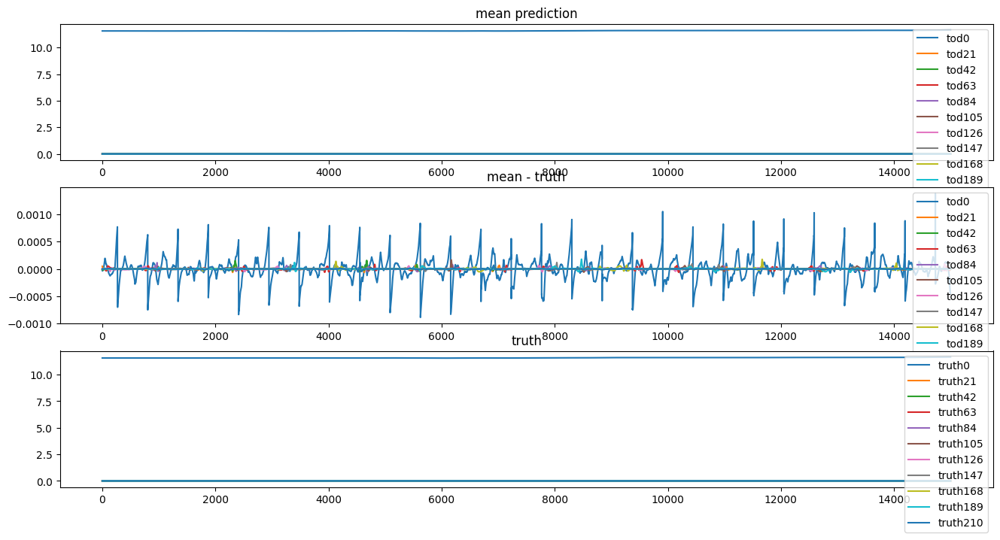

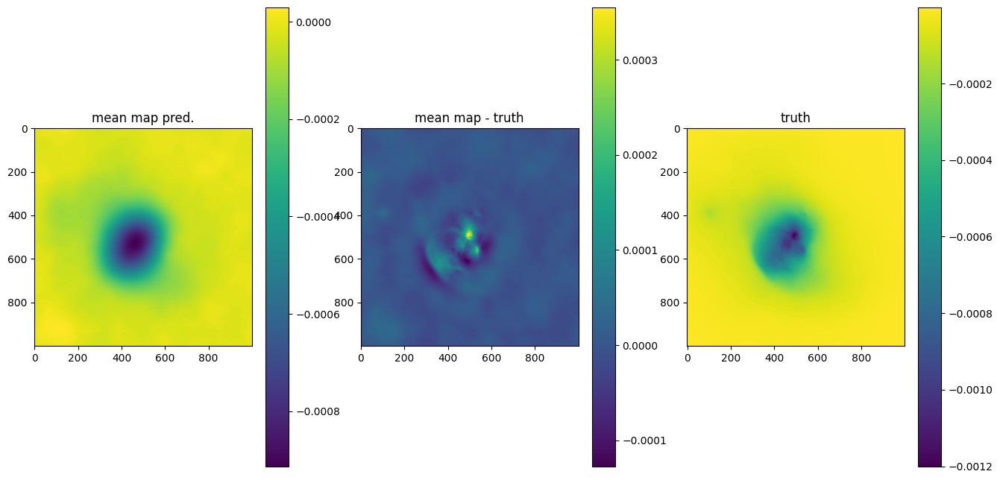

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+4.8341e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+2.6364e+18 Δ⛰:2.1977e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.5974e+17 Δ⛰:2.4767e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+3.2496e+16 Δ⛰:1.2724e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+1.2568e+16 Δ⛰:1.9929e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+1.2323e+16 Δ⛰:2.4462e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+1.0211e+16 Δ⛰:2.1125e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+8.9373e+15 Δ⛰:1.2733e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+5.8767e+15 Δ⛰:3.0606e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.4407e+15 Δ⛰:3.4360e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.8036e+15 Δ⛰:6.3712e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.5388e+15 Δ⛰:2.6478e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.3010e+15 Δ⛰:2.3779e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.2980e+15 Δ⛰:2.9850e+12 ➽:1.1700e-05
SL: Iteration 14 ⛰:+7.5348e+14 Δ⛰:5.4455e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+6.1747e+14 Δ⛰:1.3602e+14 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.9386e+14 Δ⛰:1.2361e+14 ➽:1.1700e-05
SL: 

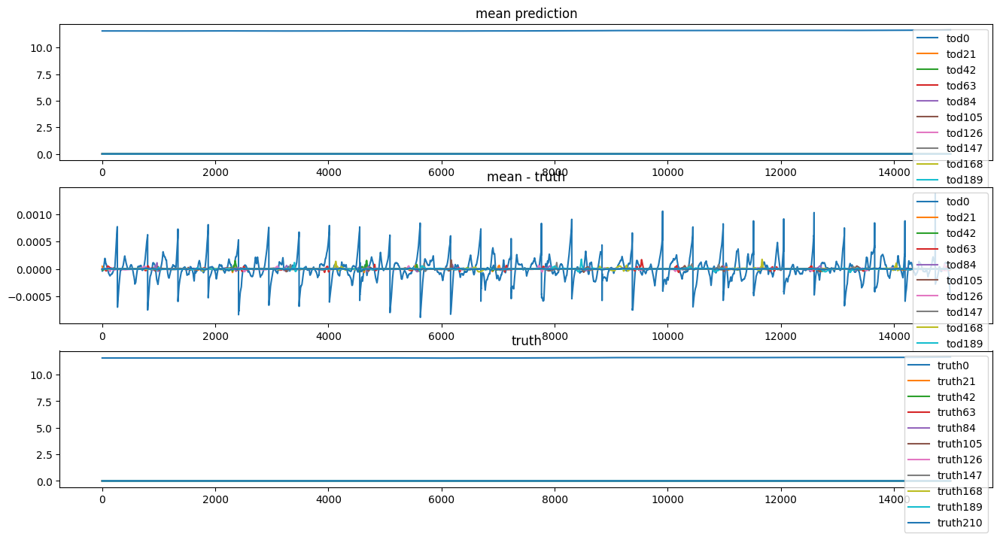

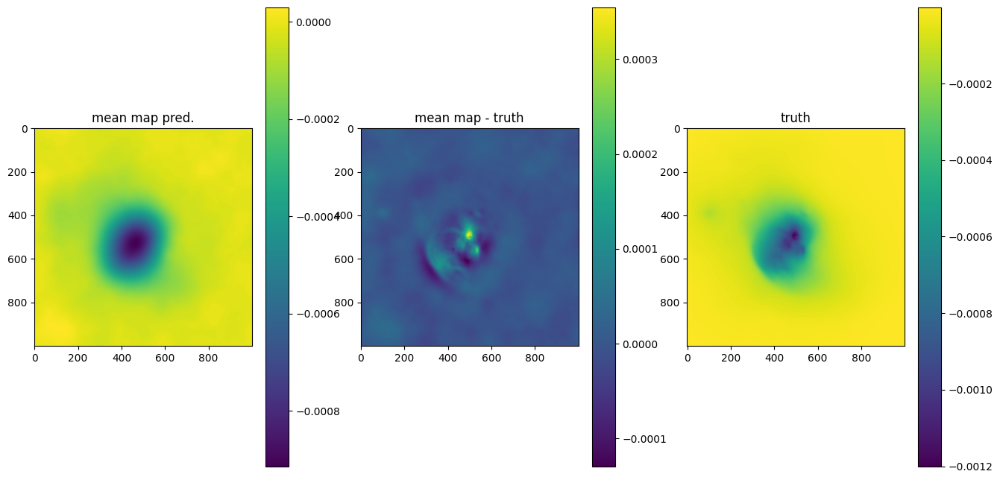

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+4.3083e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+6.8050e+17 Δ⛰:3.6278e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+8.7707e+16 Δ⛰:5.9279e+17 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.3154e+16 Δ⛰:7.4553e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+7.3132e+15 Δ⛰:5.8404e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+7.2281e+15 Δ⛰:8.5147e+13 ➽:1.1700e-05
SL: Iteration 6 ⛰:+5.9264e+15 Δ⛰:1.3017e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.6321e+15 Δ⛰:2.9431e+14 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.1376e+15 Δ⛰:2.4946e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.0851e+15 Δ⛰:1.0525e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.1768e+15 Δ⛰:9.0827e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.1008e+15 Δ⛰:7.6026e+13 ➽:1.1700e-05
SL: Iteration 12 ⛰:+8.8874e+14 Δ⛰:2.1203e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+8.8475e+14 Δ⛰:3.9943e+12 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.9696e+14 Δ⛰:2.8779e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+4.9971e+14 Δ⛰:9.7252e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.2771e+14 Δ⛰:7.1996e+13 ➽:1.1700e-05
SL: 

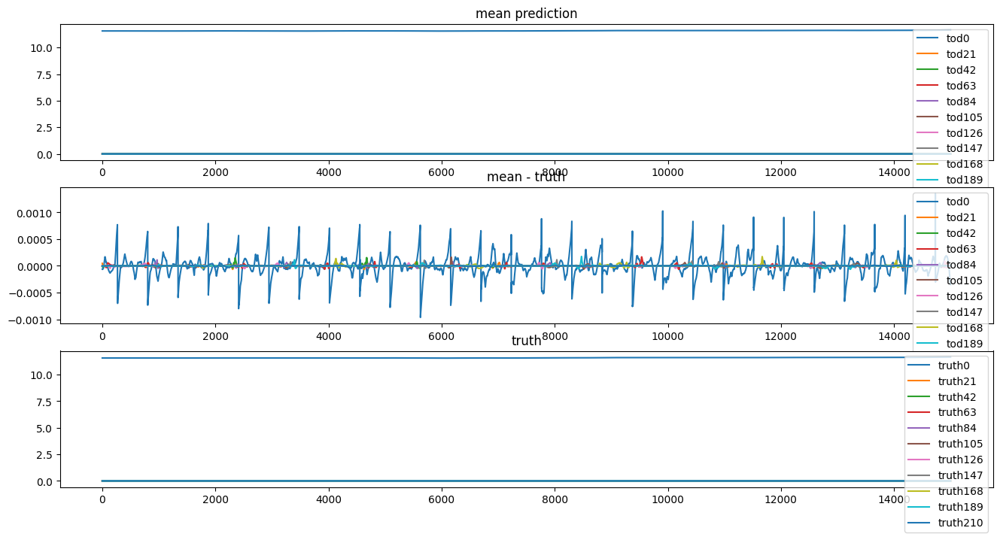

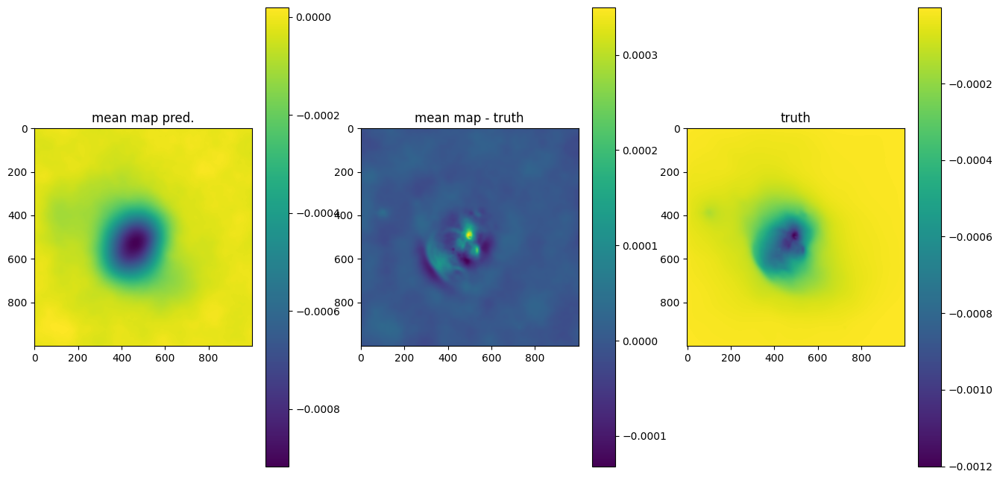

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+1.1763e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+9.0264e+17 Δ⛰:2.7363e+17 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.3745e+17 Δ⛰:7.6519e+17 ➽:1.1700e-05
SL: Iteration 3 ⛰:+2.0101e+16 Δ⛰:1.1735e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+9.3197e+15 Δ⛰:1.0782e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+9.0358e+15 Δ⛰:2.8387e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+7.5033e+15 Δ⛰:1.5325e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.1599e+15 Δ⛰:2.3435e+15 ➽:1.1700e-05
SL: Iteration 8 ⛰:+5.1402e+15 Δ⛰:1.9694e+13 ➽:1.1700e-05
SL: Iteration 9 ⛰:+1.8724e+15 Δ⛰:3.2678e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.2848e+15 Δ⛰:5.8759e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.1631e+15 Δ⛰:1.2164e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+1.0488e+15 Δ⛰:1.1435e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+1.0054e+15 Δ⛰:4.3379e+13 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.8842e+14 Δ⛰:4.1699e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+5.2463e+14 Δ⛰:6.3793e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+5.2141e+14 Δ⛰:3.2202e+12 ➽:1.1700e-05
SL: 

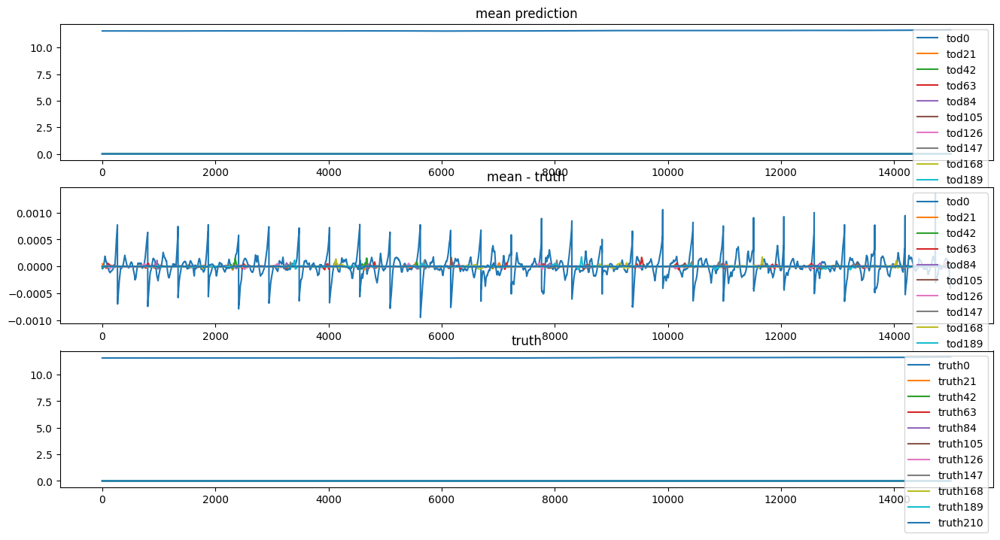

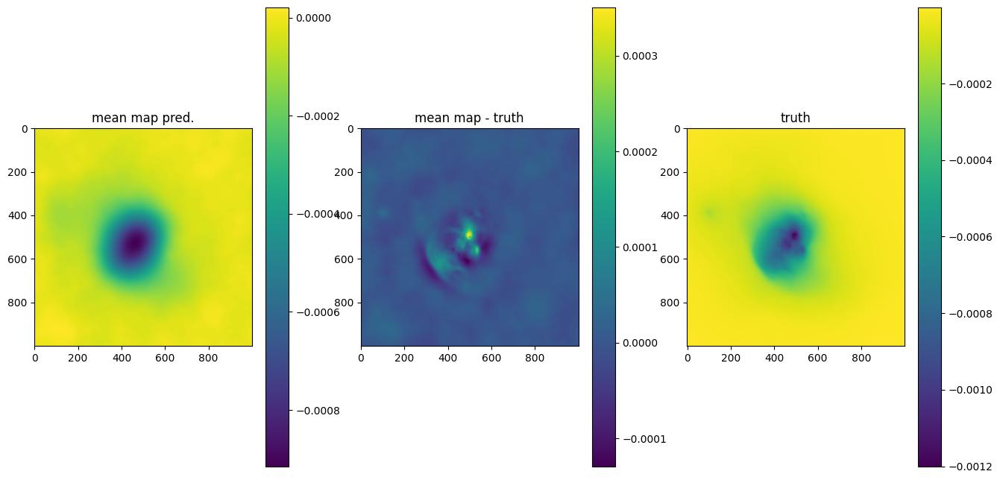

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+6.2423e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+4.5046e+18 Δ⛰:1.7376e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+1.2995e+17 Δ⛰:4.3747e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.9224e+16 Δ⛰:1.1073e+17 ➽:1.1700e-05
SL: Iteration 4 ⛰:+8.3959e+15 Δ⛰:1.0829e+16 ➽:1.1700e-05
SL: Iteration 5 ⛰:+8.0775e+15 Δ⛰:3.1841e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+6.9486e+15 Δ⛰:1.1289e+15 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.9578e+15 Δ⛰:9.9074e+14 ➽:1.1700e-05
SL: Iteration 8 ⛰:+5.3616e+15 Δ⛰:5.9619e+14 ➽:1.1700e-05
SL: Iteration 9 ⛰:+2.5172e+15 Δ⛰:2.8445e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+2.3487e+15 Δ⛰:1.6845e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.2599e+15 Δ⛰:1.0888e+15 ➽:1.1700e-05
SL: Iteration 12 ⛰:+8.6514e+14 Δ⛰:3.9472e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+8.6283e+14 Δ⛰:2.3095e+12 ➽:1.1700e-05
SL: Iteration 14 ⛰:+6.1234e+14 Δ⛰:2.5049e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+6.0753e+14 Δ⛰:4.8091e+12 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.4935e+14 Δ⛰:1.5817e+14 ➽:1.1700e-05
SL: 

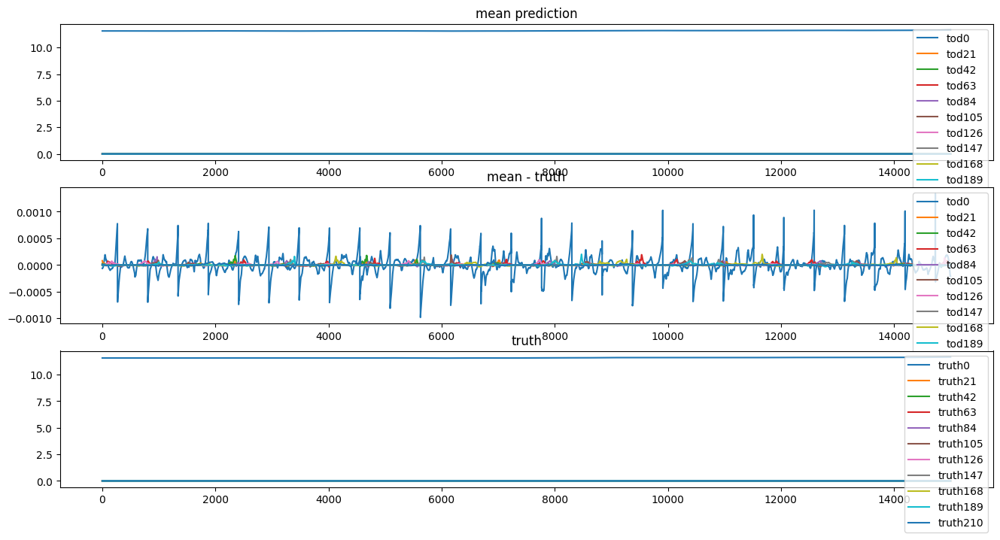

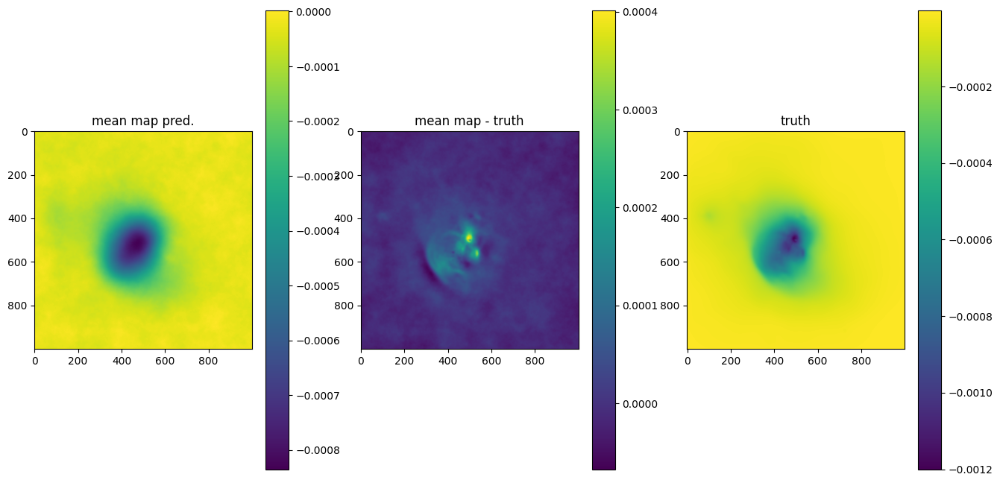

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+1.0132e+19 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.3390e+18 Δ⛰:8.7932e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+6.9827e+16 Δ⛰:1.2692e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+8.5426e+15 Δ⛰:6.1285e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+5.9818e+15 Δ⛰:2.5608e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+5.4774e+15 Δ⛰:5.0439e+14 ➽:1.1700e-05
SL: Iteration 6 ⛰:+5.0219e+15 Δ⛰:4.5549e+14 ➽:1.1700e-05
SL: Iteration 7 ⛰:+4.0834e+15 Δ⛰:9.3855e+14 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.5431e+15 Δ⛰:5.4023e+14 ➽:1.1700e-05
SL: Iteration 9 ⛰:+1.9593e+15 Δ⛰:1.5839e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.1055e+15 Δ⛰:8.5382e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+9.8518e+14 Δ⛰:1.2029e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+8.8820e+14 Δ⛰:9.6977e+13 ➽:1.1700e-05
SL: Iteration 13 ⛰:+8.8500e+14 Δ⛰:3.2050e+12 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.5684e+14 Δ⛰:3.2815e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+4.4498e+14 Δ⛰:1.1186e+14 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.3891e+14 Δ⛰:6.0686e+12 ➽:1.1700e-05
SL: 

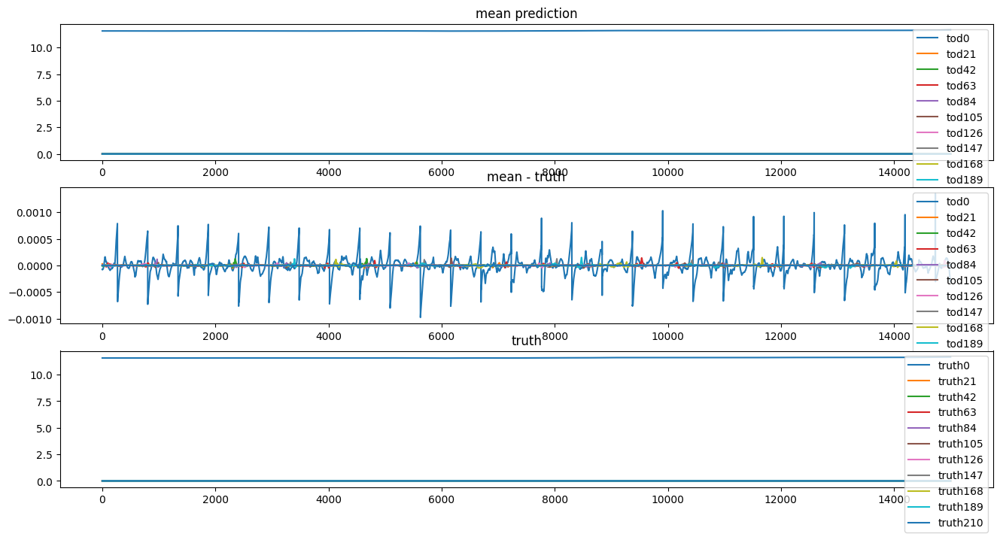

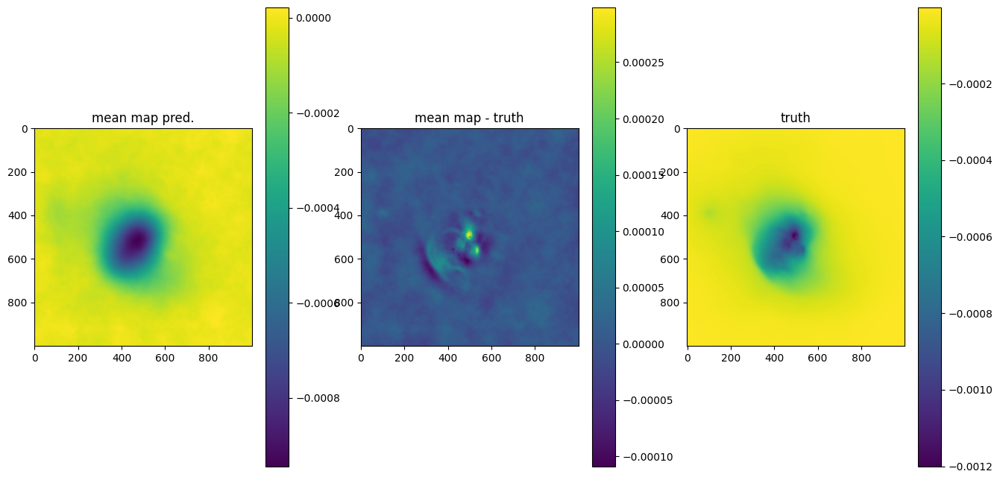

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+7.2324e+18 Δ⛰:inf ➽:1.1700e-05
SL: Iteration 1 ⛰:+1.7347e+18 Δ⛰:5.4978e+18 ➽:1.1700e-05
SL: Iteration 2 ⛰:+6.5237e+16 Δ⛰:1.6694e+18 ➽:1.1700e-05
SL: Iteration 3 ⛰:+1.1022e+16 Δ⛰:5.4214e+16 ➽:1.1700e-05
SL: Iteration 4 ⛰:+7.3487e+15 Δ⛰:3.6738e+15 ➽:1.1700e-05
SL: Iteration 5 ⛰:+6.2375e+15 Δ⛰:1.1112e+15 ➽:1.1700e-05
SL: Iteration 6 ⛰:+5.9487e+15 Δ⛰:2.8882e+14 ➽:1.1700e-05
SL: Iteration 7 ⛰:+5.8897e+15 Δ⛰:5.9024e+13 ➽:1.1700e-05
SL: Iteration 8 ⛰:+3.8973e+15 Δ⛰:1.9923e+15 ➽:1.1700e-05
SL: Iteration 9 ⛰:+1.7756e+15 Δ⛰:2.1217e+15 ➽:1.1700e-05
SL: Iteration 10 ⛰:+1.4440e+15 Δ⛰:3.3167e+14 ➽:1.1700e-05
SL: Iteration 11 ⛰:+1.1662e+15 Δ⛰:2.7781e+14 ➽:1.1700e-05
SL: Iteration 12 ⛰:+9.2808e+14 Δ⛰:2.3808e+14 ➽:1.1700e-05
SL: Iteration 13 ⛰:+9.2799e+14 Δ⛰:9.0438e+10 ➽:1.1700e-05
SL: Iteration 14 ⛰:+5.9188e+14 Δ⛰:3.3611e+14 ➽:1.1700e-05
SL: Iteration 15 ⛰:+5.0769e+14 Δ⛰:8.4186e+13 ➽:1.1700e-05
SL: Iteration 16 ⛰:+4.9757e+14 Δ⛰:1.0122e+13 ➽:1.1700e-05
SL: 

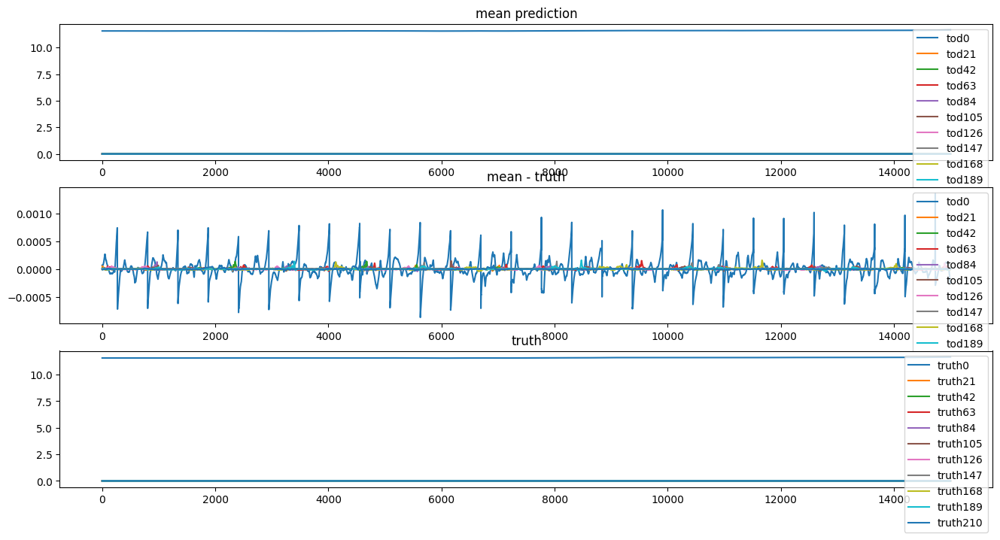

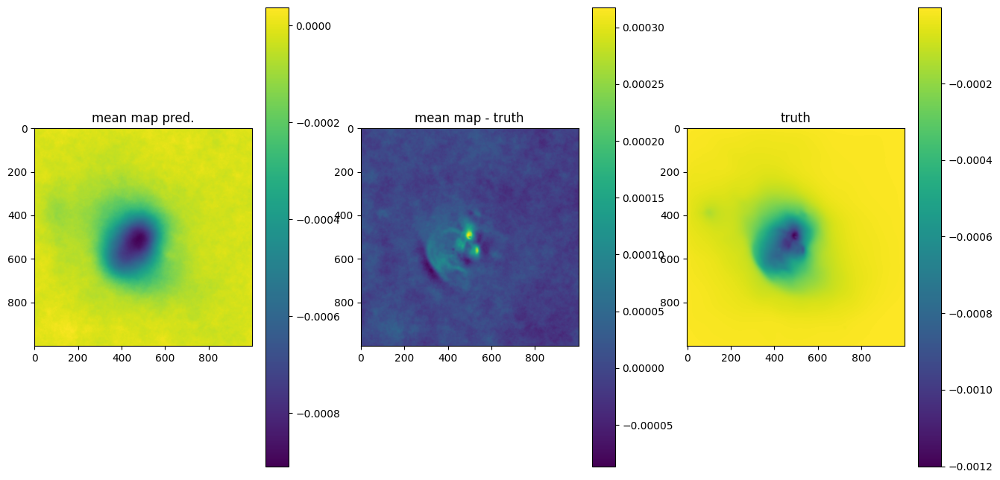

In [21]:
# n_it = 5
n_it = 20
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
# if noiselevel == 0.0: delta = 1e-6
if noiselevel == 0.0: delta = 1e-10
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(3, 1, figsize=(16, 8))

    for i in range(0, mean.shape[0], mean.shape[0]//10):
        im0 = axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        im1 = axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - truth[i], label=f"tod{i}")
        im2 = axes_tods[2].plot(truth[i], label=f"truth{i}")

    axes_tods[0].title.set_text('mean prediction')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth')
    axes_tods[1].legend()
    axes_tods[2].title.set_text('truth')
    axes_tods[2].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 8))

    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [22]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.010481241332040097, 1, 0.1
	loglogvarslope: -3.6034626854829903, -3, 0.5
	zeromode: 1.3476688198289323e-05, 10.0, 2.0
map:
	fluctuations: 2.1462573630384443e-05, 0.001, 0.0001
	loglogvarslope: -2.9328499884620856, -3.0, 0.5
	zeromode: -0.00010901368782187276, -8.7e-05, 5e-06


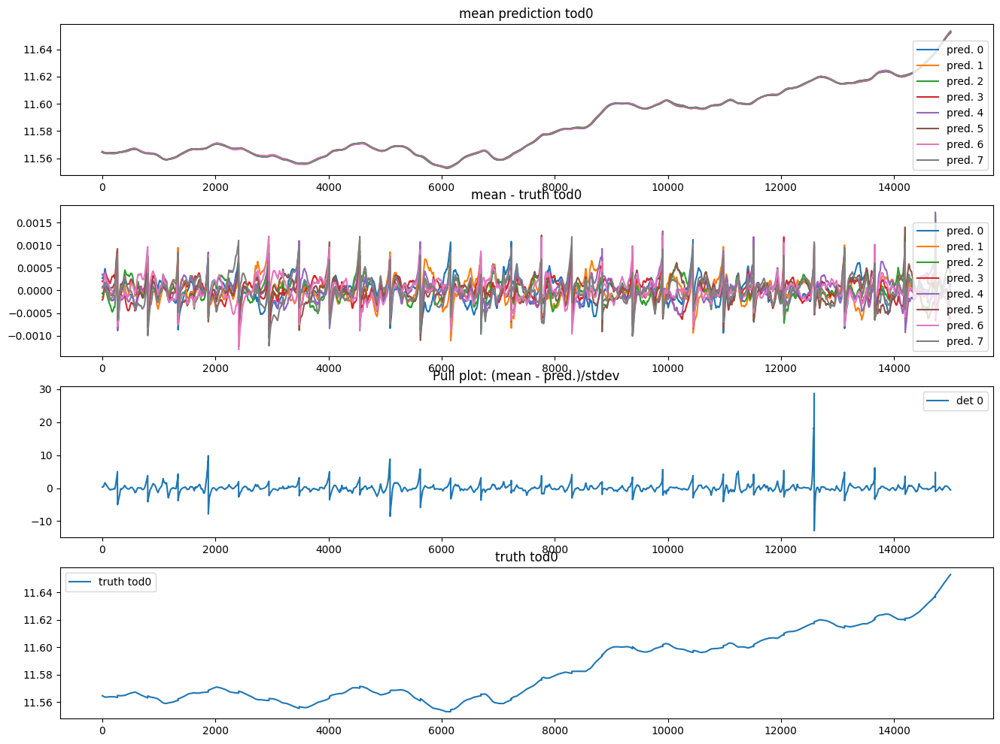

In [23]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 0
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - truth[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - truth[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(truth[i], label=f"truth tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()